# Import and setup

In [1]:
__author__ = 'can'
__version__ = "$1.0 $"
__date__ = "$Date: 2023/06/13 8:54 $"

import numpy as np
import fcsparser
import matplotlib
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import BaggingClassifier
from sklearn import neighbors, datasets
import scanpy as sc
import flowio
import flowutils

folder = 'Dom_flow/UO1 CsA neonatal flow files 120922/'
folder_files = os.listdir(folder)
folder_files.sort()

In [2]:
%matplotlib inline

# Read samples

In [3]:
import flowkit

bead_dir = folder + "Compensation_Controls/"
matrix = flowkit.calculate_compensation_from_beads(bead_dir)

Check compensation control

In [38]:
matrix_esther = pd.read_csv('Dom_flow/UO1 CsA neonatal flow files 120922/neo_compensation_matrix.csv', index_col=0)
matrix_esther

,APC-A :: ThPOK,APC-Cy7-A :: live_dead,FITC-A :: GATA3,Pacific Blue-A :: CD127,AmCyan-A :: CD5,BV 605-A :: TCRb,BV 785-A :: CD69,BUV 396-A :: CD8a,BUV 737-A :: CD4,PE-A :: Runx3,PE-Cy7-A :: CD24
APC-A :: ThPOK,1.000000,0.245000,0.0005,0.002000,0.000500,0.000252,0.012618,0.000549,0.042310,0.002000,0.045000
APC-Cy7-A :: live_dead,0.004758,1.000000,0.0006,0.000500,0.000500,0.000321,0.101360,0.000200,0.058032,0.000500,0.089942
FITC-A :: GATA3,0.000000,0.001644,1.0000,0.007000,0.032000,0.015000,0.000000,0.000589,0.000530,0.006000,0.000000
Pacific Blue-A :: CD127,0.010000,0.001702,0.0140,1.000000,0.240000,0.045000,0.010000,0.002000,0.000000,0.015000,0.002095
AmCyan-A :: CD5,0.001000,0.000698,0.0030,0.170000,1.000000,0.643838,0.067405,0.003000,0.050000,0.005000,0.001804
BV 605-A :: TCRb,0.002265,0.000551,0.0000,0.022000,0.001000,1.000000,0.120000,0.001000,0.069560,0.149775,0.030859
BV 785-A :: CD69,0.002000,0.071000,0.0001,0.023091,0.002236,0.001214,1.000000,0.000100,0.048000,0.000000,0.010138
BUV 396-A :: CD8a,0.000000,0.000000,0.0010,0.000859,0.000491,0.002701,0.000000,1.000000,0.000428,0.003000,0.000570
BUV 737-A :: CD4,0.001320,0.135000,0.0020,0.002000,0.000000,0.000000,0.028161,0.015615,1.000000,0.000000,0.009208
PE-A :: Runx3,0.000100,0.000500,0.0055,0.000034,0.000500,0.043000,0.001714,0.000059,0.003000,1.000000,0.013875


Compensation Controls_Pacific Blue Stained Control_005.fcs


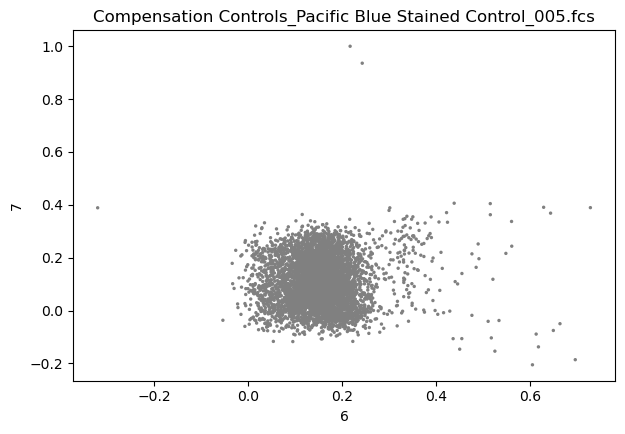

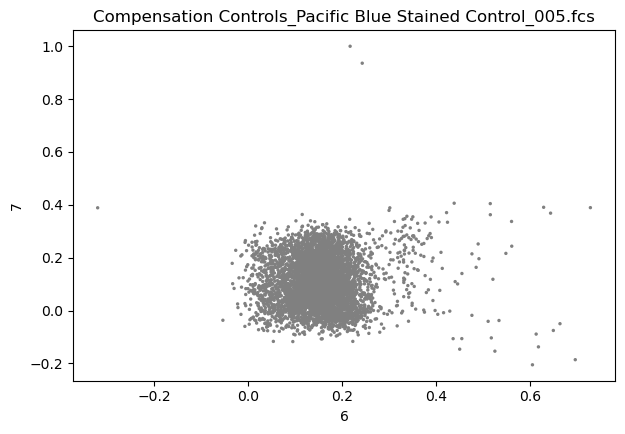

Compensation Controls_PE-Cy7 Stained Control_012.fcs


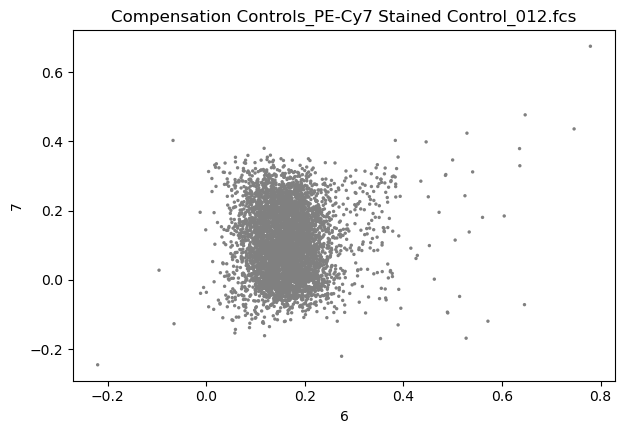

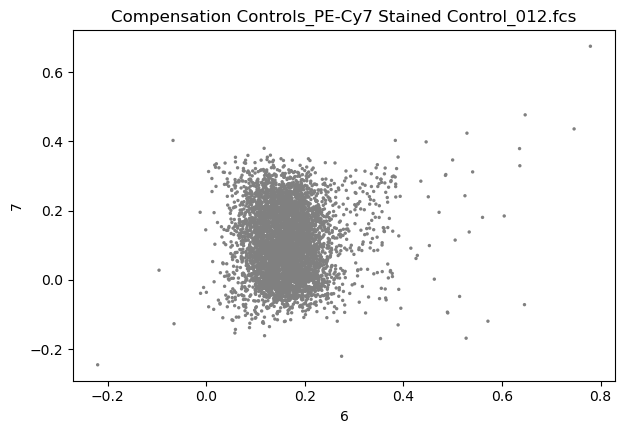

Compensation Controls_BV 605 Stained Control_007.fcs


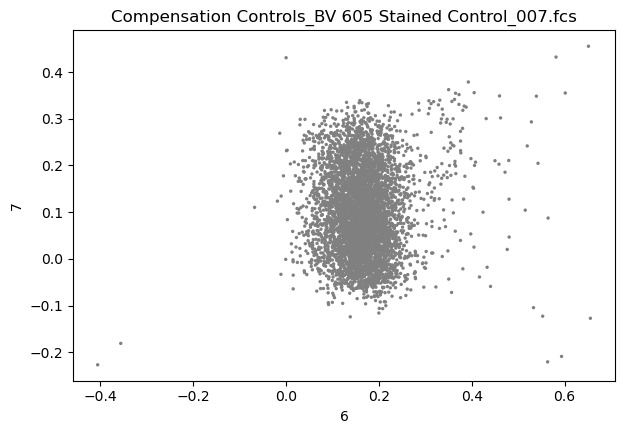

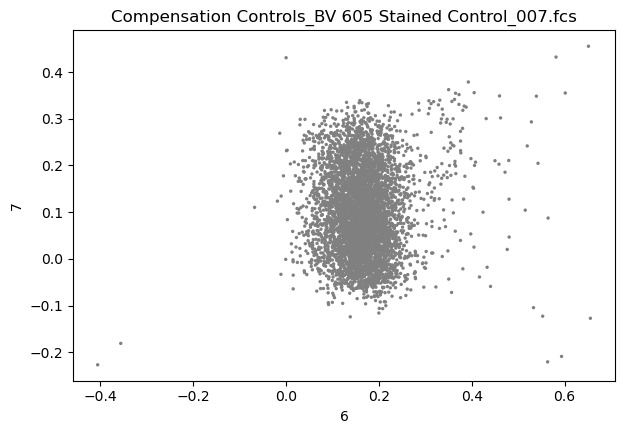

Compensation Controls_APC-Cy7 Stained Control_003.fcs


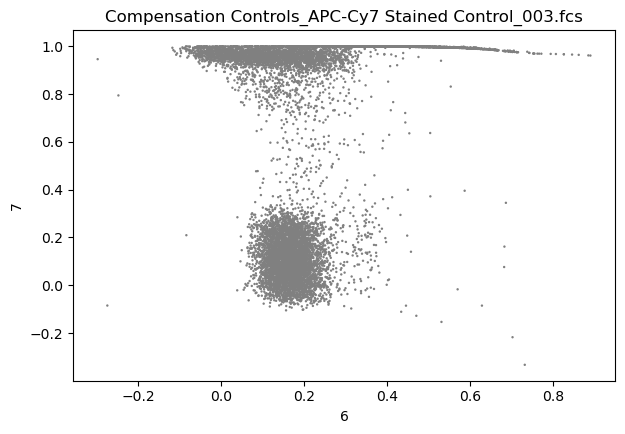

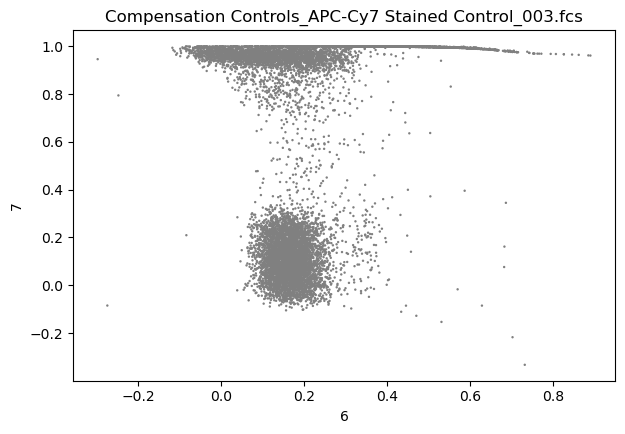

Compensation Controls_BV 785 Stained Control_008.fcs


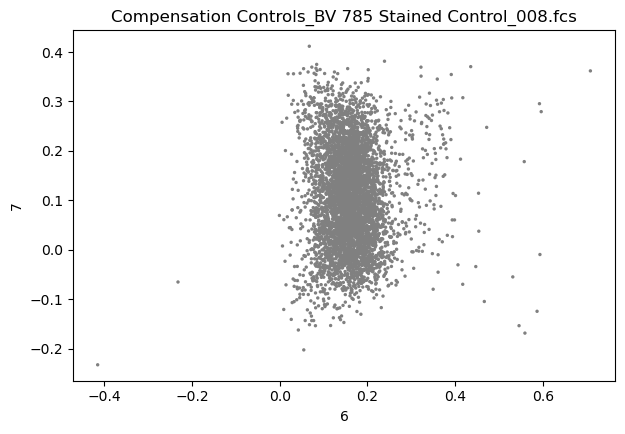

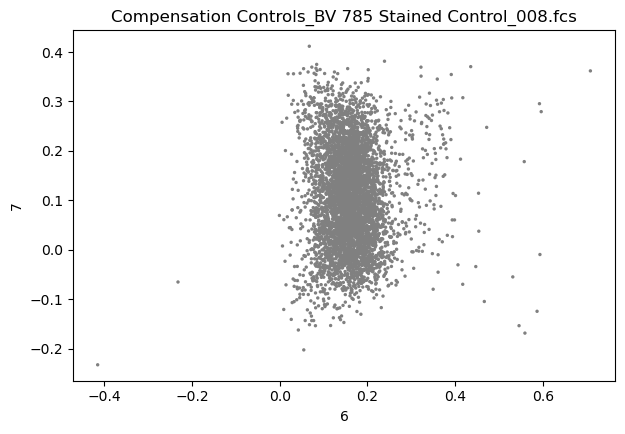

Compensation Controls_BUV 396 Stained Control_009.fcs


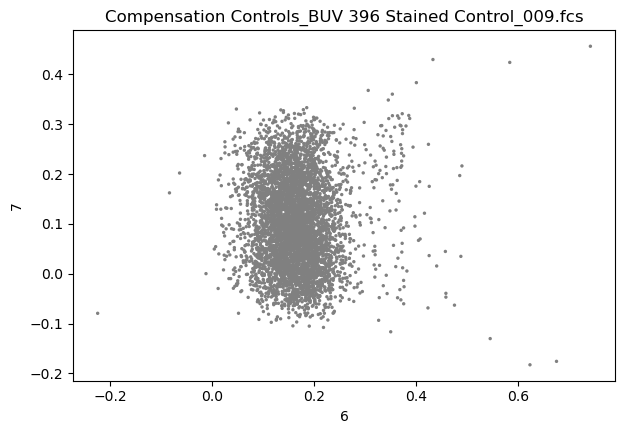

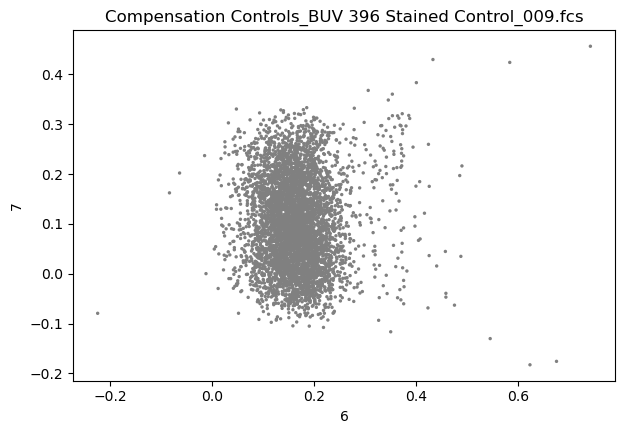

Compensation Controls_BUV 737 Stained Control_010.fcs


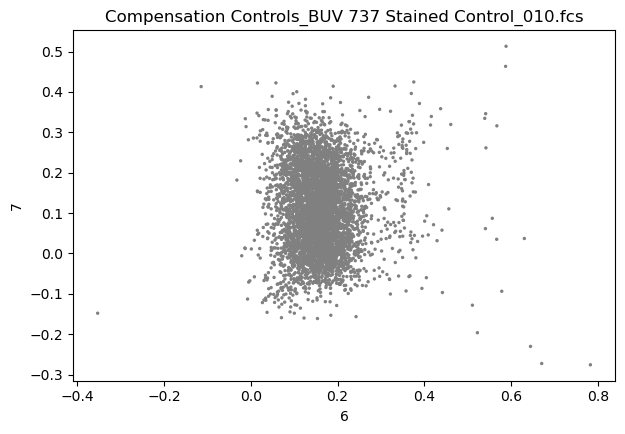

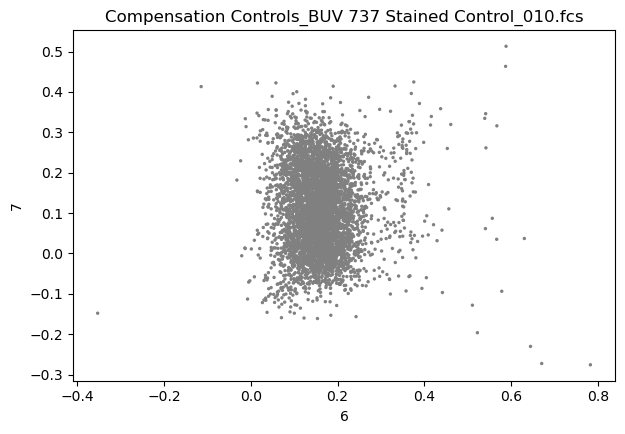

Compensation Controls_PE Stained Control_011.fcs


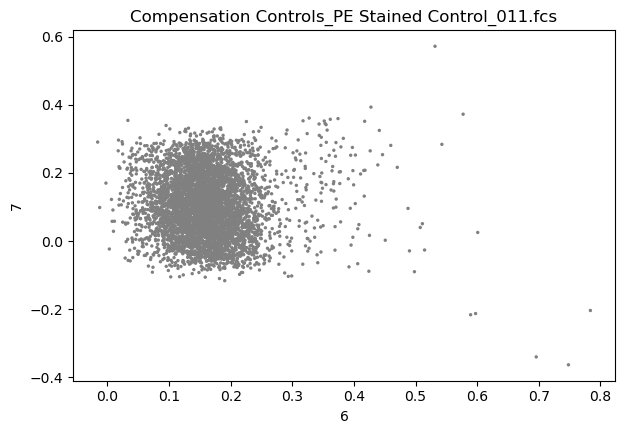

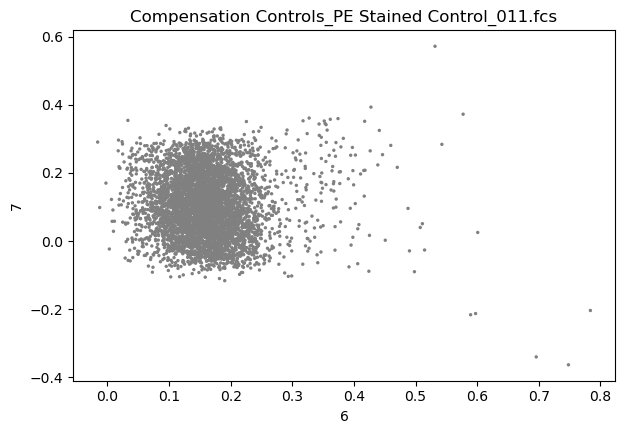

Compensation Controls_AmCyan Stained Control_006.fcs


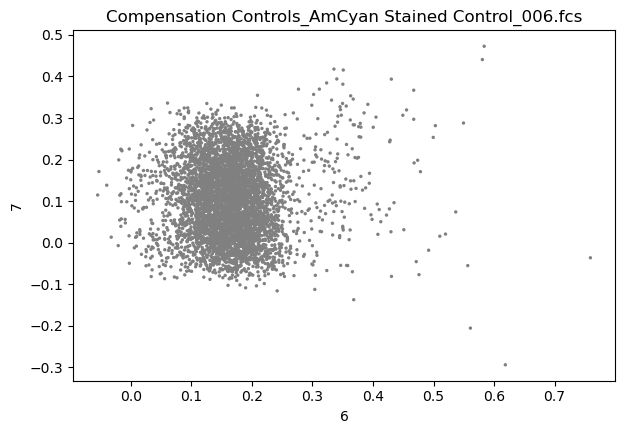

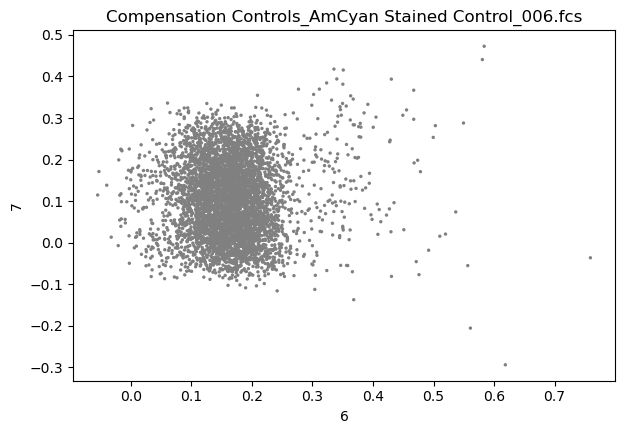

Compensation Controls_FITC Stained Control_004.fcs


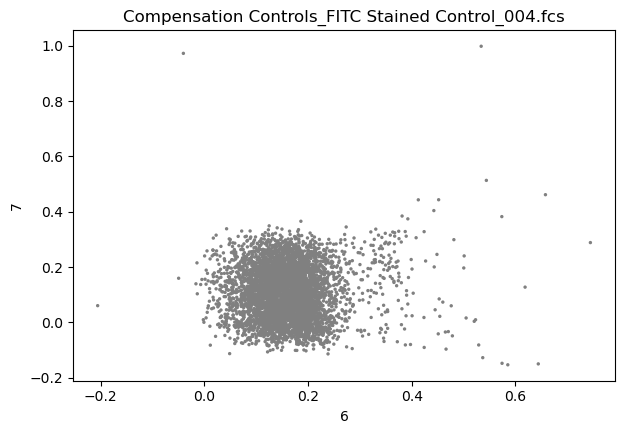

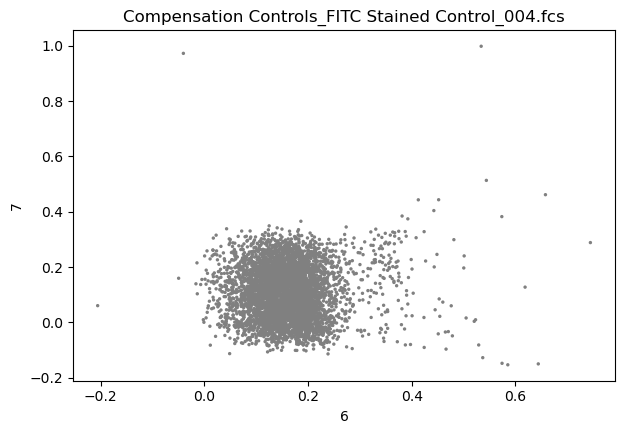

Compensation Controls_APC Stained Control_002.fcs


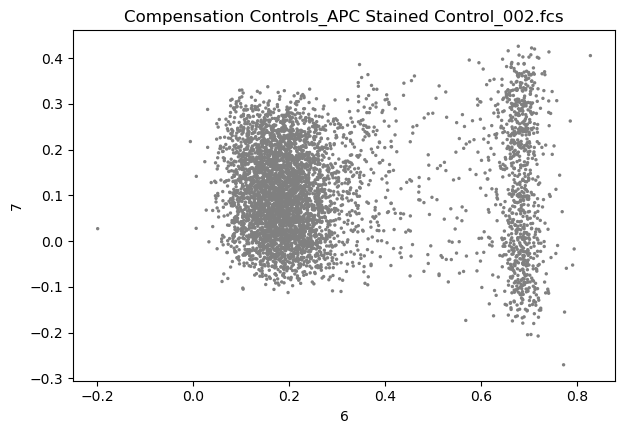

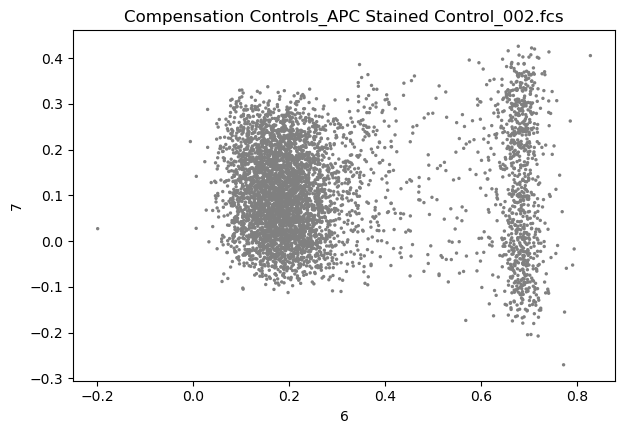

In [39]:
beads = {}
for i in os.listdir(bead_dir):
    if "fcs" in i:
        print(i)
        fd = flowio.FlowData(bead_dir + i)
        events = np.reshape(fd.events, (-1, fd.channel_count))

        channels = pd.DataFrame(fd.channels).T
        name = i.split('.')[0]

        beads[name] = sc.AnnData(events)
        
        beads[name].layers['compensated'] = flowutils.compensate.compensate(
            beads[name].X, matrix.as_dataframe().values, fluoro_indices=range(6,17))
        xform_events = flowutils.transforms.logicle(beads[name].layers['compensated'], channel_indices=None)
        beads[name].layers['compensated_biexponential'] = xform_events
        sc.pl.scatter(beads[name],
                      x='6', y='7', title=i,
                      layers='compensated_biexponential')

        beads[name].layers['compensated_esther'] = flowutils.compensate.compensate(
            beads[name].X, matrix_esther.values, fluoro_indices=range(6,17))
        xform_events = flowutils.transforms.logicle(beads[name].layers['compensated'], channel_indices=None)
        beads[name].layers['compensated_esther_biexponential'] = xform_events
        sc.pl.scatter(beads[name],
                      x='6', y='7', title=i,
                      layers='compensated_esther_biexponential')

Read files, compensate counts and biexponential transform

In [40]:
folder_files = [x for x in folder_files if x[-3:] == 'fcs']
all_data = {}
compensation = {}
sample_dict = {
    file[-7:-4]:file.split('.')[0] for file in folder_files if "Compensation" not in file}

In [41]:
all_data = {}

for i in folder_files:
    if 'Compensation Controls' in i:
        continue
    else:
        fd = flowio.FlowData(folder + i)
        spill_over = flowutils.compensate.get_spill(fd.text['spill'])
        events = np.reshape(fd.events, (-1, fd.channel_count))
        xform_events = flowutils.transforms.logicle(events, channel_indices=None)

        channels = pd.DataFrame(fd.channels).T
        channels.PnS.fillna(channels.PnN, inplace=True)
        channels.rename(columns={"PnN": "Channel", "PnS": "Staining"}, inplace=True)
        channels.index = channels['Staining']
        
        name = i.split('.')[0]
        
        all_data[name] = sc.AnnData(events)
        all_data[name].layers['biexponential'] = xform_events
        all_data[name].layers['unnormalized'] = events
        all_data[name].var = channels
        all_data[name].obs['Sample'] = name
        all_data[name].obs['Timepoint'] = name.split("_")[0]
        all_data[name].obs['Drug'] = name.split("_")[1]
        all_data[name].obs['Dose'] = name.split("_")[2].split('-')[0] if name.split("_")[2].split('-')[0]!="drug" else "0ug" 
        all_data[name].obs['Tube'] = name.split("_")[3]
        
        all_data[name] = all_data[name][all_data[name][:, 'FSC-H'].X > 5000].copy()
        all_data[name] = all_data[name][all_data[name][:, 'FSC-H'].X < 150000].copy()
        all_data[name] = all_data[name][all_data[name][:, 'SSC-A'].X > 20000].copy()
        all_data[name] = all_data[name][all_data[name][:, 'SSC-A'].X < 150000].copy()
        all_data[name] = all_data[name][all_data[name][:, 'FSC-W'].X > 60000].copy()
        all_data[name] = all_data[name][all_data[name][:, 'FSC-W'].X < 90000].copy()

In [44]:
for i in all_data:
    all_data[i].layers['compensated'] = flowutils.compensate.compensate(
        all_data[i].X, matrix_esther.values, fluoro_indices=range(6,17))
    xform_events = flowutils.transforms.logicle(all_data[i].layers['compensated'], channel_indices=None)
    all_data[i].layers['compensated_biexponential'] = xform_events

In [46]:
complete_data = anndata.concat(all_data.values(), axis=0,
               join='inner', keys=all_data.keys(), label="Sample")
complete_data.obs["original_ID"] = complete_data.obs_names
complete_data.obs_names_make_unique()
complete_data = complete_data[complete_data[:, 'live/dead'].layers['compensated_biexponential']<0.45].copy()

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [47]:
complete_data

AnnData object with n_obs × n_vars = 6635354 × 18
    obs: 'Sample', 'Timepoint', 'Drug', 'Dose', 'Tube', 'original_ID'
    layers: 'biexponential', 'unnormalized', 'compensated', 'compensated_biexponential'

In [48]:
complete_data.write('all_data_flow_thymus.h5ad')

# Analyze sample

In [50]:
complete_data = sc.read('all_data_flow_thymus.h5ad')

In [51]:
complete_data.raw = complete_data.copy()

In [52]:
complete_data.X = complete_data.layers['compensated_biexponential']

Filter low quality events (small cells) and subset to fluorescent channels.

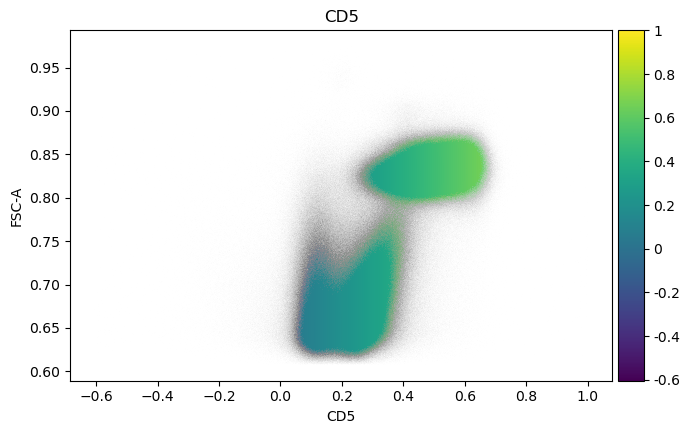

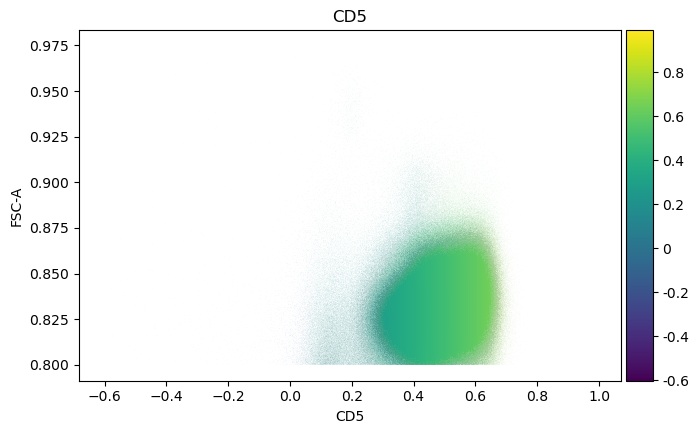

In [54]:
sc.pl.scatter(complete_data, x='CD5', y='FSC-A', color='CD5', use_raw=False)
subset_data = complete_data[complete_data[:, 'FSC-A'].X>0.8].copy()
sc.pl.scatter(subset_data, x='CD5', y='FSC-A', color='CD5', use_raw=False)

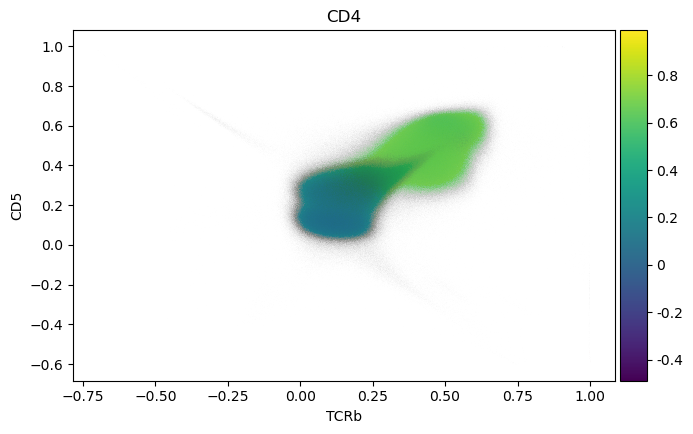

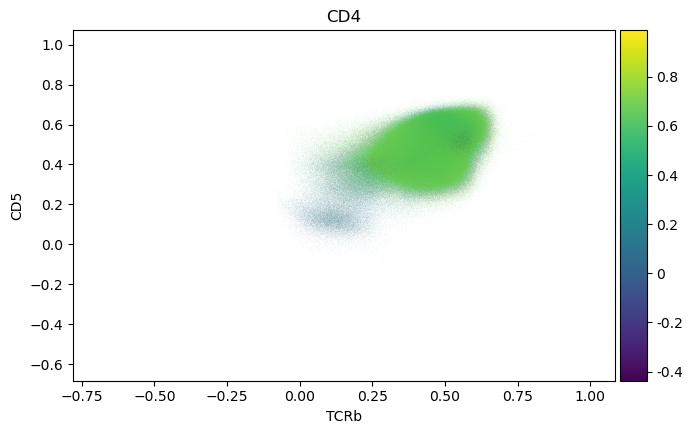

In [55]:
sc.pl.scatter(complete_data, x='TCRb', y='CD5', color='CD4', use_raw=False)
sc.pl.scatter(subset_data, x='TCRb', y='CD5', color='CD4', use_raw=False)

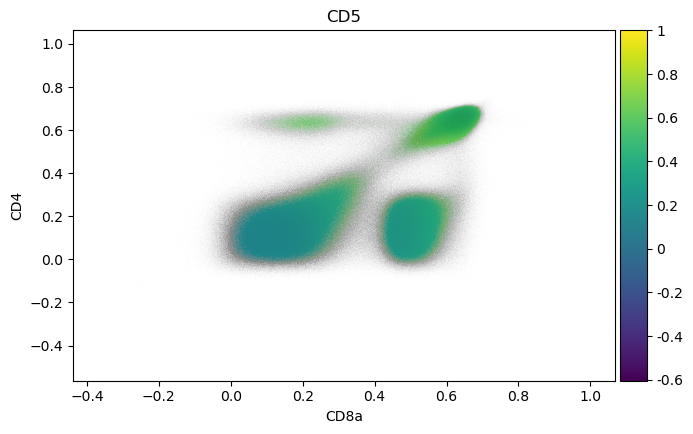

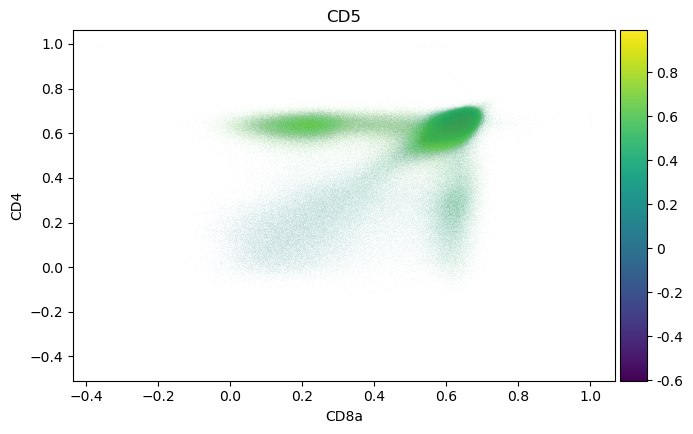

In [56]:
sc.pl.scatter(complete_data, x='CD8a', y='CD4', color='CD5', use_raw=False)
sc.pl.scatter(subset_data, x='CD8a', y='CD4', color='CD5', use_raw=False)

In [ ]:
subset_data = subset_data[:, subset_data.var_names[[6,8,9,10,11,12,13,14,15,16]]].copy()
subset_data

AnnData object with n_obs × n_vars = 2767679 × 10
    obs: 'Sample', 'Timepoint', 'Drug', 'Dose', 'Tube', 'original_ID'
    layers: 'biexponential', 'compensated', 'compensated_biexponential', 'unnormalized'

Min-max scaling and PCA

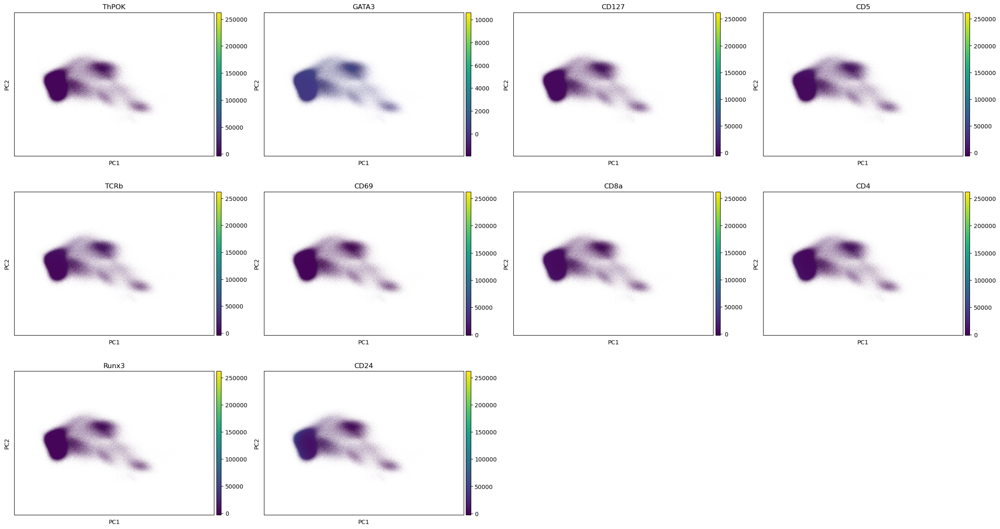

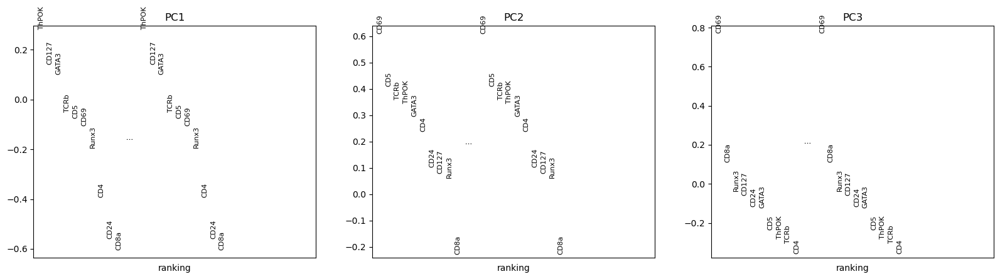

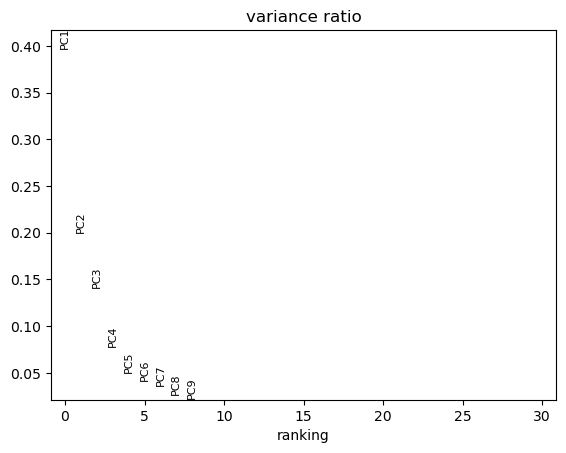

In [ ]:
subset_data.X = subset_data.layers['compensated_biexponential'].copy()
subset_data.X = (subset_data.X - subset_data.X.min(axis=0)) / (subset_data.X.max(axis=0) - subset_data.X.min(axis=0))
sc.tl.pca(subset_data)
sc.pl.pca_overview(subset_data, color=list(subset_data.var_names))

## Dimensionality reduction

In [ ]:
sc._settings.n_jobs = 30

sc.external.tl.phate(subset_data, k=20, knn_max=300, n_components=2, gamma=1.0, knn_dist='euclidean', mds_dist='euclidean', mds='metric')
sc.external.pl.phate(subset_data, color=list(subset_data.var_names), layer='compensated_biexponential')

In [ ]:
subset_data.obs["Drug_Dose"] = (
    subset_data.obs["Drug"].astype(str) + subset_data.obs["Dose"].astype(str))
subset_data.obs["Drug_Dose_Timepoint"] = (
    subset_data.obs["Drug_Dose"] + subset_data.obs["Timepoint"].astype(str))

Clustering to various resolutions.

In [ ]:
import parc

parc1 = parc.PARC(subset_data.X, resolution_parameter=0.3,
                  jac_std_global=0.2, random_seed=1, small_pop=5000)  
parc1.run_PARC()

parc_labels = parc1.labels
subset_data.obs["low_res_PARC"] = pd.Categorical(parc_labels)

sc.pl.umap(subset_data, color='low_res_PARC')

In [ ]:
parc1 = parc.PARC(subset_data.X, resolution_parameter=1.0,
                  jac_std_global=0.15, random_seed=1, small_pop=200)  
parc1.run_PARC()

parc_labels = parc1.labels
subset_data.obs["PARC"] = pd.Categorical(parc_labels)

sc.pl.umap(subset_data, color='PARC')

In [ ]:
parc1 = parc.PARC(subset_data.X, resolution_parameter=1.5, keep_all_local_dist=False,
                  jac_std_global=0.15, random_seed=1, small_pop=200)  
parc1.run_PARC()

parc_labels = parc1.labels
subset_data.obs["PARC_higher"] = pd.Categorical(parc_labels)

sc.pl.umap(subset_data, color='PARC_higher')

PAGA for initialization of UMAP and computing UMAP embedding

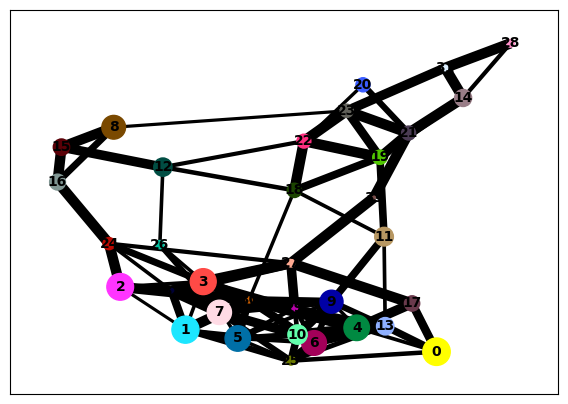

In [ ]:
sc.pp.neighbors(subset_data, n_neighbors=30, metric='euclidean')
sc.tl.paga(subset_data, groups='PARC')
sc.pl.paga(subset_data, threshold=0.3)

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


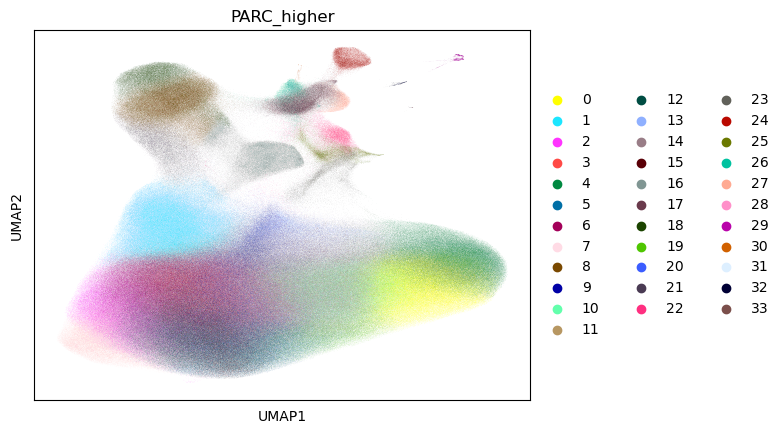

In [ ]:
if 'X_umap_paga_cosine_euclidean' in subset_data.obsm:
    subset_data.obsm['X_umap'] = subset_data.obsm['X_umap_paga_cosine_euclidean']
else:
    sc.pp.neighbors(subset_data, n_neighbors=30, metric='euclidean')
    sc.tl.umap(subset_data, maxiter=1500, min_dist=0.3, spread=1.0, init_pos='paga')
    subset_data.obsm['X_umap_paga_cosine_euclidean'] = subset_data.obsm['X_umap'] 

sc.pl.umap(subset_data, color='PARC_higher')

In [ ]:
subset_data.write('subset_data_flow_thymus.h5ad')

# Further study of clusters

In [ ]:
subset_data = sc.read('subset_data_flow_thymus.h5ad')

In [ ]:
subset_data

AnnData object with n_obs × n_vars = 2767679 × 10
    obs: 'Sample', 'Timepoint', 'Drug', 'Dose', 'Tube', 'original_ID', 'Drug_Dose', 'Drug_Dose_Timepoint', 'low_res_PARC', 'PARC', 'PARC_higher', 'umap_density_Drug_Dose', '_tmp_embedding_density_column_9162_', '_tmp_embedding_density_column_1083_', 'pheno', 'pheno_sub', 'curr_index'
    uns: 'Dose_colors', 'Drug_colors', 'PARC_colors', 'PARC_higher_colors', 'PARC_sizes', 'Tube_colors', 'curr_index_colors', 'dendrogram_PARC_higher', 'dendrogram_pheno', 'dendrogram_pheno_sub', 'low_res_PARC_colors', 'neighbors', 'paga', 'pca', 'pheno_colors', 'pheno_sub_colors', 'umap', 'umap_density_Drug_Dose_params'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_umap_paga_cosine', 'X_umap_paga_cosine_euclidean', 'X_umap_spectral', 'X_umap_spectral_cosine'
    varm: 'PCs'
    layers: 'biexponential', 'compensated', 'compensated_biexponential', 'unnormalized'

In [ ]:
subset_data.obsm['X_umap'] = subset_data.obsm['X_umap_paga_cosine_euclidean']

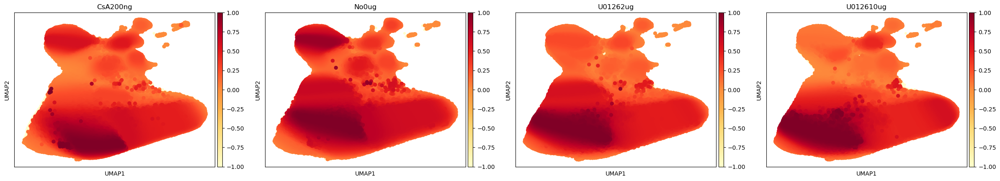

In [ ]:
# sc.tl.embedding_density(subset_data, basis='umap', groupby='Drug_Dose')
sc.pl.embedding_density(subset_data, basis='umap', key='umap_density_Drug_Dose', vmax=None, vmin=None)

In [ ]:
subset_data_direct = subset_data[subset_data.obs['Timepoint']!='72h']

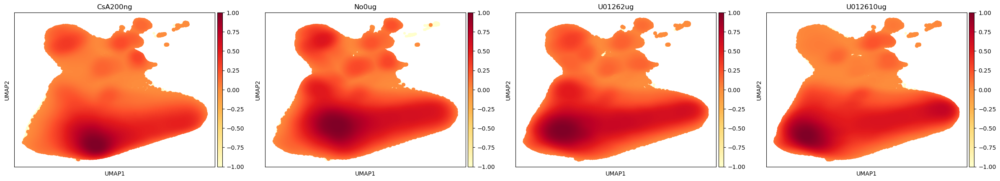

In [ ]:
# sc.tl.embedding_density(subset_data_direct, basis='umap', groupby='Drug_Dose')
sc.pl.embedding_density(subset_data_direct, basis='umap', key='umap_density_Drug_Dose', vmax=None, vmin=None)

In [ ]:
tmp = subset_data_direct.obs[['Tube', 'Drug', 'Dose', 'PARC']].groupby(['Tube', 'PARC'])['Tube'].count().unstack()
tmp = tmp.rename(columns=str).reset_index()
tmp.index=tmp['Tube']
tmp = tmp.drop('Tube', 1)
scaled = tmp.div(tmp.sum(axis=1), axis=0)

meta_info = subset_data.obs[[
    'Tube', 'Drug', 'Dose']].drop_duplicates().set_index('Tube')
tmp = tmp.merge(meta_info, how='inner', left_index=True, right_index=True)
scaled = scaled.merge(meta_info, how='inner', left_index=True, right_index=True)

/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_43200/256799403.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp = tmp.drop('Tube', 1)


In [ ]:
values = scaled.columns[0:len(subset_data.obs.PARC.unique())]

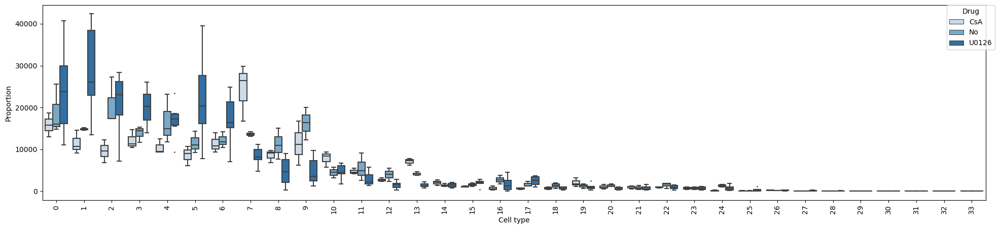

In [ ]:
import seaborn as sns

df = pd.melt(tmp, id_vars=['Drug'], value_vars=values)

fig, ax = plt.subplots(figsize=(24,5))
d = sns.boxplot(x='variable', y = 'value', hue=df["Drug"], data=df, fliersize=1,
               palette='Blues')

d.set_ylabel('Proportion')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')
#d.set_ylim([0,0.5])
plt.legend(bbox_to_anchor=(1.01, 1), borderaxespad=0., title="Drug")
plt.show()

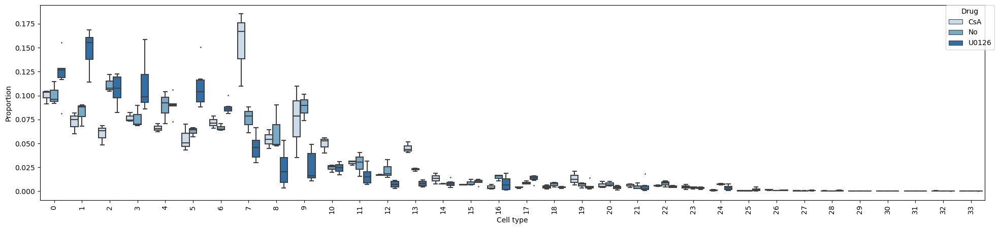

In [ ]:
import seaborn as sns

df = pd.melt(scaled, id_vars=['Drug'], value_vars=values)

fig, ax = plt.subplots(figsize=(24,5))
d = sns.boxplot(x='variable', y = 'value', hue=df["Drug"], data=df, fliersize=1,
               palette='Blues')

d.set_ylabel('Proportion')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')
#d.set_ylim([0,0.5])
plt.legend(bbox_to_anchor=(1.01, 1), borderaxespad=0., title="Drug")
plt.show()

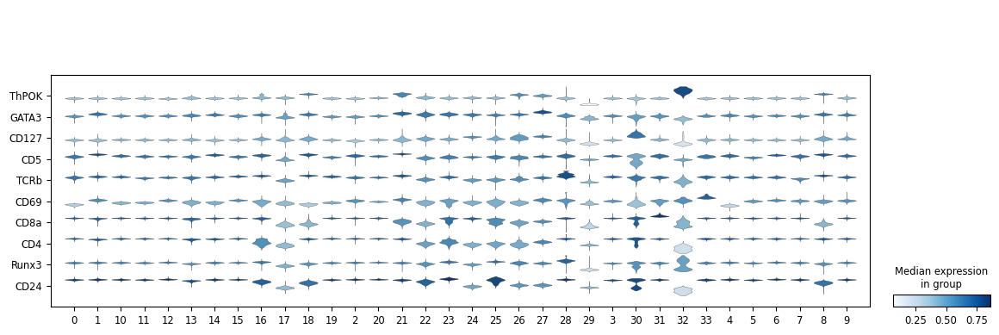

In [ ]:
subset_data.obs['PARC_higher'] = subset_data.obs['PARC_higher'].astype(str).astype("category")
sc.pl.stacked_violin(subset_data, var_names=subset_data.var_names, groupby='PARC_higher', swap_axes=True, dendrogram=False, use_raw=False)

Inspect clustering and rename to meaningful populations.

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


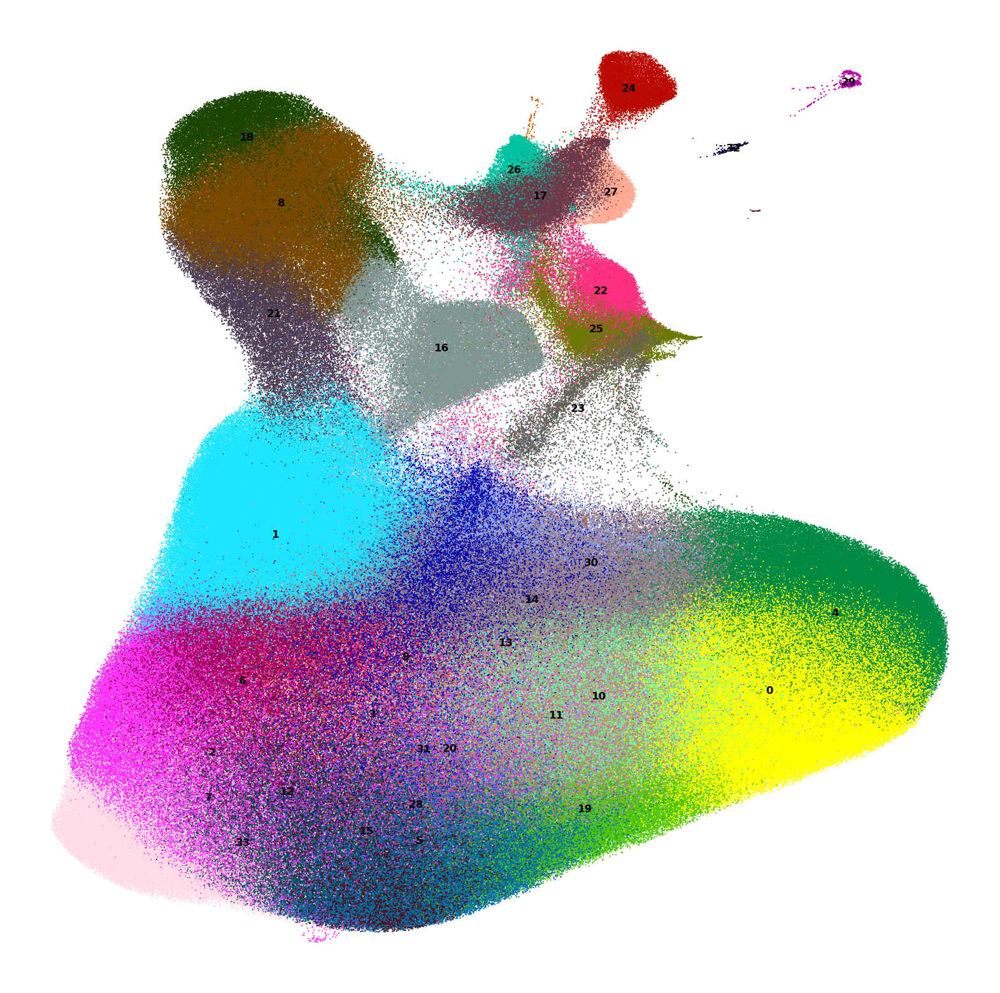

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
sc.pl.umap(
    subset_data_direct, 
    color="PARC_higher",
    frameon=False,
    title="",
    legend_loc="on data",
    legend_fontsize="large",
    ax=ax, size=10
)

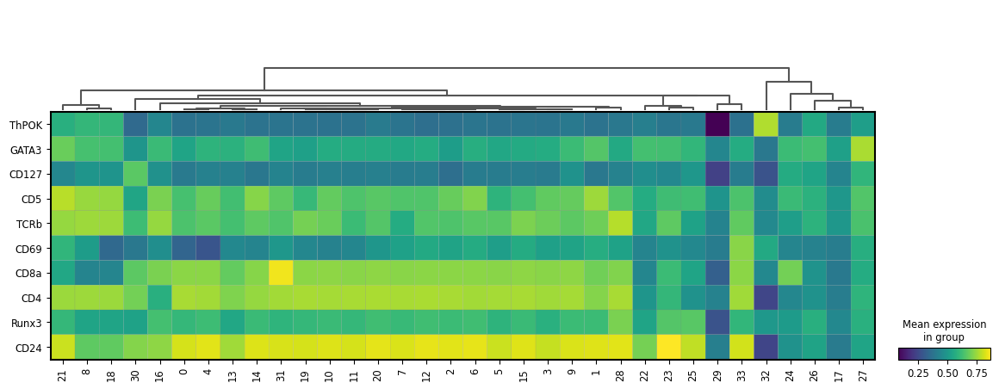

In [ ]:
sc.pl.matrixplot(subset_data_direct, var_names=subset_data_direct.var_names, swap_axes=True, dendrogram=True, groupby='PARC_higher', use_raw=False)

In [5]:
subset_data = sc.read('subset_data_flow_thymus.h5ad')

In [4]:
subset_data.obs['pheno'] = subset_data.obs['PARC_higher'].astype('str').astype('category')
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'0': 'DP1'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'4': 'DP1'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'30': 'DP1'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'10': 'DP2_a'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'11': 'DP2_a'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'19': 'DP2_a'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'14': 'DP2_a'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'13': 'DP2_a'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'20': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'31': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'3': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'12': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'1': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'9': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'2': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'6': 'DP2_c'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'5': 'DP2_b'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'15': 'DP2_b'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'28': 'DP2_b'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'33': 'DP2_b'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'7': 'early_negative_sel'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'5': 'DP_CD5++'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'21': 'CD4_transitional'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'8': 'CD4_sp'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'18': 'CD4_sp'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'16': 'CD8_sp'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'25': 'DN_precursor'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'23': 'DN_precursor'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'22': 'DN_precursor'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'26': 'negative_selection'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'27': 'negative_selection'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'17': 'negative_selection'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'24': 'Gamma_Delta'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'32': 'unconventional_ThPok++'})
subset_data.obs['pheno'] = subset_data.obs['pheno'].replace({'29': 'unconventional_ThPok--'})

In [3]:
import seaborn as sns

sns.reset_orig()
sc.settings._vector_friendly = True
# p9.theme_set(p9.theme_classic)
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["savefig.transparent"] = True
plt.rcParams["figure.figsize"] = (4, 4)

plt.rcParams["axes.titlesize"] = 15
plt.rcParams["axes.titleweight"] = "normal"
plt.rcParams["axes.titlepad"] = 8.0
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.labelweight"] = "normal"
plt.rcParams["axes.linewidth"] = 1.2
plt.rcParams["axes.labelpad"] = 6.0
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

plt.rcParams["font.size"] = 11
# plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', "Computer Modern Sans Serif", "DejaVU Sans"]
plt.rcParams['font.weight'] = "normal"

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['xtick.minor.size'] = 1.375
plt.rcParams['xtick.major.size'] = 2.75
plt.rcParams['xtick.major.pad'] = 2
plt.rcParams['xtick.minor.pad'] = 2

plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['ytick.minor.size'] = 1.375
plt.rcParams['ytick.major.size'] = 2.75
plt.rcParams['ytick.major.pad'] = 2
plt.rcParams['ytick.minor.pad'] = 2

plt.rcParams["legend.fontsize"] = 12
plt.rcParams['legend.handlelength'] = 1.4
plt.rcParams['legend.numpoints'] = 1
plt.rcParams['legend.scatterpoints'] = 3

plt.rcParams['lines.linewidth'] = 1.7
DPI = 300

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


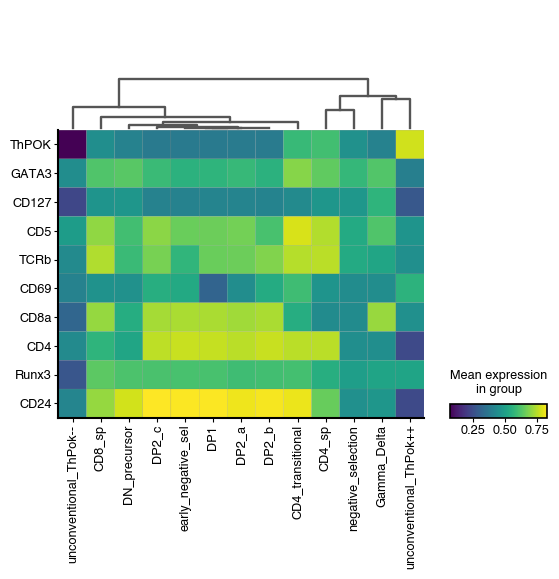

In [ ]:
sc.tl.dendrogram(subset_data, var_names=subset_data.var_names, groupby='pheno', optimal_ordering=True)
sc.pl.matrixplot(subset_data, var_names=subset_data.var_names, swap_axes=True,
                 dendrogram=True, groupby='pheno', use_raw=False, save='matrixplot_all.pdf')

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


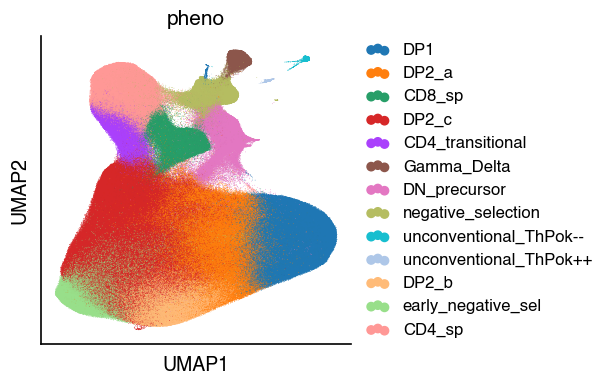

In [ ]:
sc.pl.umap(subset_data, color='pheno', size=1, save="all_cell_all_clusters.pdf")

In [ ]:
subset_data.obs['pheno_category'] = subset_data.obs['pheno'].cat.codes

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


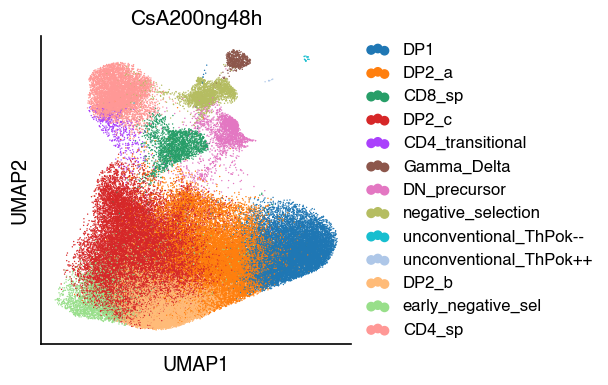

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


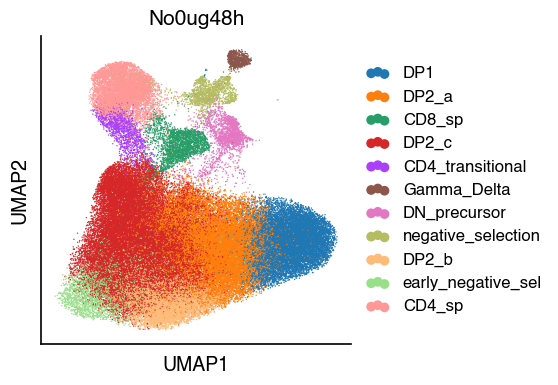

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


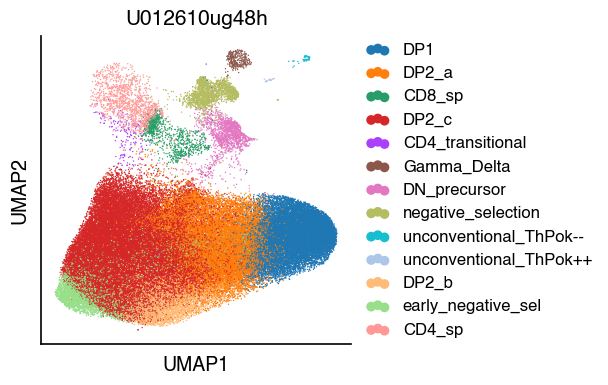

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


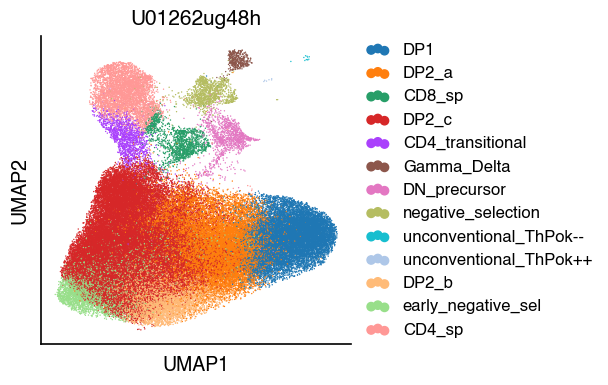

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


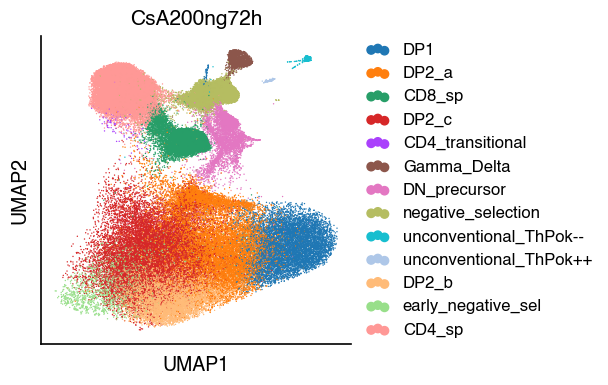

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


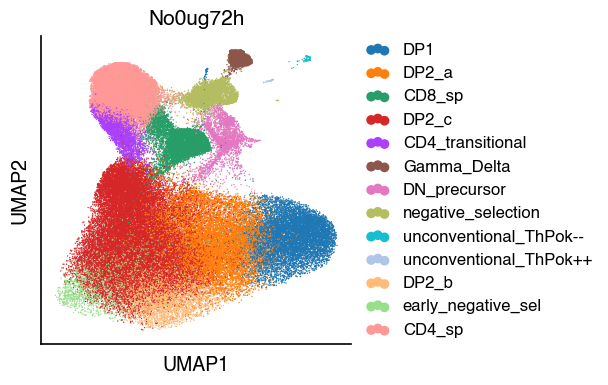

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


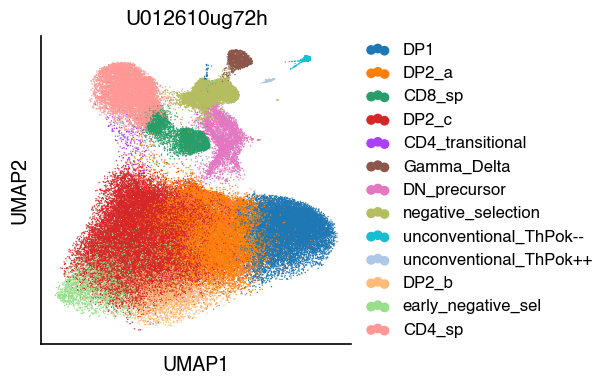

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


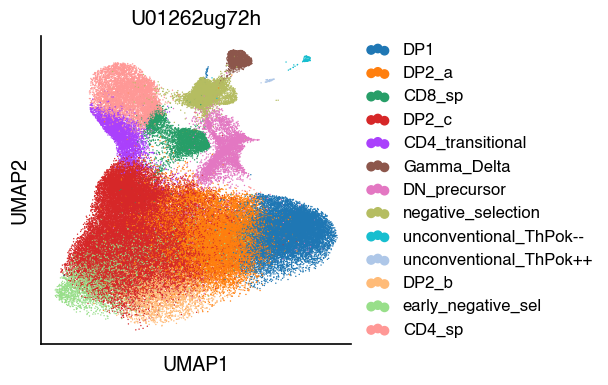

In [ ]:
for i in subset_data.obs['Drug_Dose_Timepoint'].unique():
    curr_data = subset_data[np.random.choice(subset_data[subset_data.obs['Drug_Dose_Timepoint']==i].obs_names, size=100000, replace=False)]
    sc.pl.umap(subset_data[
        np.random.choice(subset_data[subset_data.obs['Drug_Dose_Timepoint']==i].obs_names, size=100000, replace=False)],
               color='pheno', palette={subset_data.obs['pheno'].cat.categories[i]:subset_data.uns['pheno_colors'][i] for i in curr_data.obs['pheno_category'].unique()}, size=4, save=i + "_all_clusters_subset.pdf", title=i)   

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


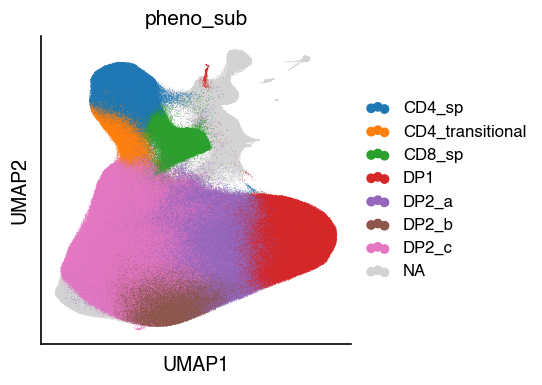

In [6]:
#subset_data.obsm['X_umap'] = subset_data.obsm['X_umap_spectral_cosine']
#subset_data.obsm['X_umap'] = subset_data.obsm['X_umap_spectral_cosine'] 
subset_data.obs['pheno_sub'] = [i if i in ['DP1', 'DP2_b', 'DP2_a', 'CD8_sp', 'DP2_c', 'CD4_transitional', 'CD4_sp'] else None for i in subset_data.obs['pheno']]
sc.pl.umap(subset_data, color='pheno_sub', size=1, save="subclusters_all_clusters.pdf")

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


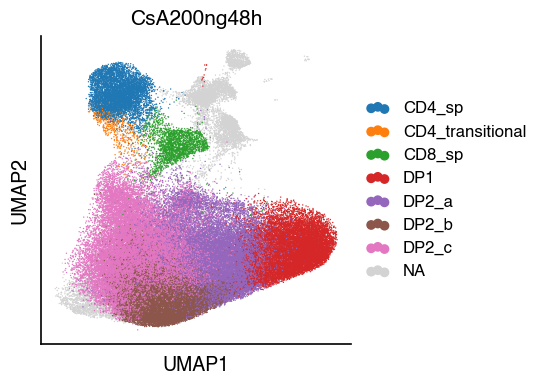

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


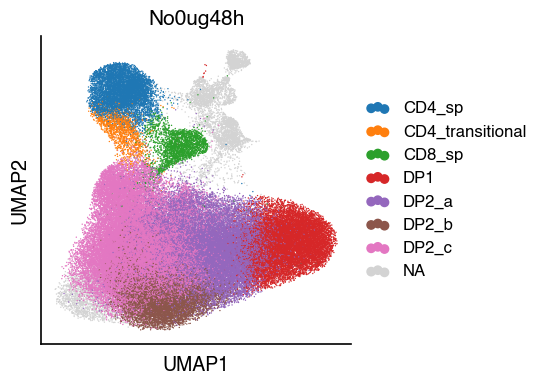

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


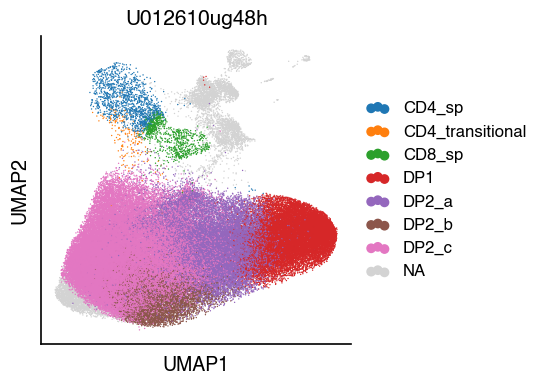

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


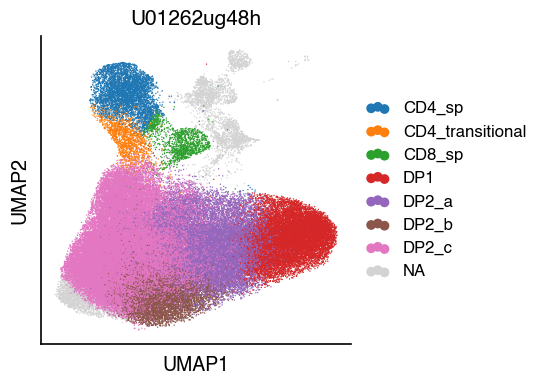

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


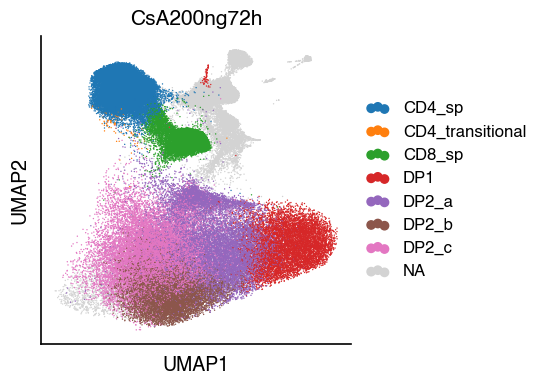

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


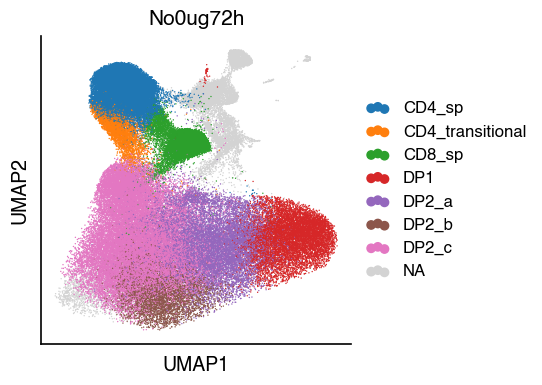

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


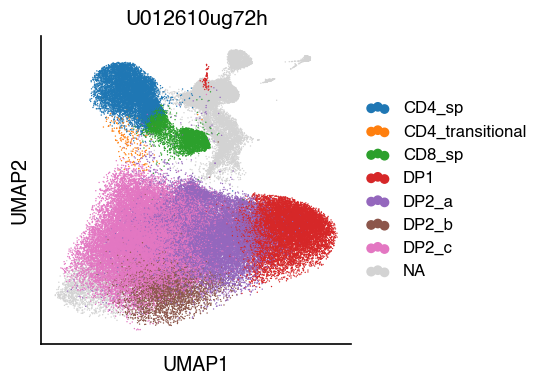

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


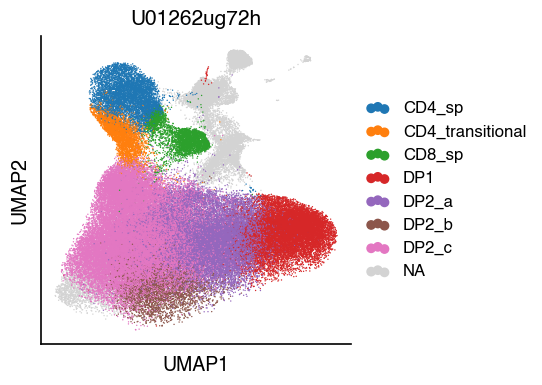

In [8]:
for i in subset_data.obs['Drug_Dose_Timepoint'].unique():
    curr_events = subset_data[subset_data.obs['Drug_Dose_Timepoint']==i]
    sc.pl.umap(curr_events[np.random.choice(curr_events.obs_names, size=100000, replace=False)], color='pheno_sub', size=4, save=i + "_subclusters_subset.pdf", title=i)   

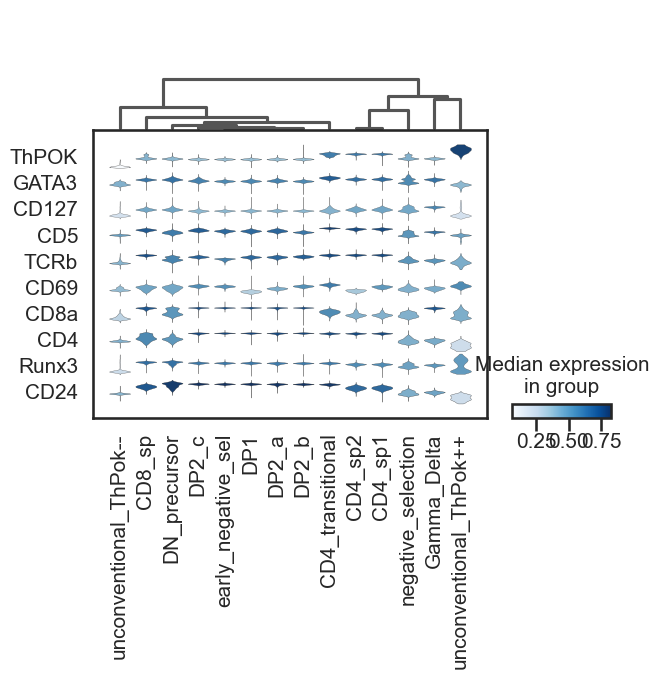

In [ ]:
sc.pl.stacked_violin(subset_data, var_names=subset_data.var_names, groupby='pheno', swap_axes=True, dendrogram=True, use_raw=False)

In [9]:
subset_data_direct = subset_data[subset_data.obs['Timepoint']!='48h']

In [10]:
tmp = subset_data.obs[['Tube', 'Drug_Dose_Timepoint', 'pheno']].groupby(['Tube', 'pheno'])['Tube'].count().unstack()
tmp = tmp.rename(columns=str).reset_index()
tmp.index=tmp['Tube']
tmp

pheno,Tube,DP1,DP2_a,CD8_sp,DP2_c,CD4_transitional,Gamma_Delta,DN_precursor,negative_selection,unconventional_ThPok--,unconventional_ThPok++,DP2_b,early_negative_sel,CD4_sp
Tube,,,,,,,,,,,,,,
001,001,5635,8156,3936,16042,1833,1000,1192,3327,0,0,2401,1718,10997
002,002,4300,5626,5714,12821,2044,1148,1589,2972,4,1,1778,1277,14444
003,003,6829,8651,6891,19450,2736,992,2553,2593,174,54,3402,1516,16536
004,004,1626,3688,1871,3092,21,606,1473,4892,0,1,1768,252,4808
005,005,5589,9254,6566,9735,58,509,2077,6123,146,42,6714,1255,16391
006,006,2859,5200,2538,6809,45,810,2412,3564,226,71,2999,851,5162
007,007,8927,12006,1868,22051,2552,962,3149,2175,1,0,2327,2799,2792
008,008,7104,10170,2427,19282,2116,1058,3145,2133,215,48,1575,2593,4143
009,009,4797,7323,1115,12323,1112,837,1561,3080,0,1,905,2005,1995


In [11]:
tmp = subset_data.obs[['Tube', 'Drug_Dose_Timepoint', 'pheno']].groupby(['Tube', 'pheno'])['Tube'].count().unstack()
tmp = tmp.rename(columns=str).reset_index()
tmp.index=tmp['Tube']
tmp = tmp.drop('Tube', 1)
scaled = tmp.div(tmp.sum(axis=1), axis=0)

meta_info = subset_data.obs[[
    'Tube', 'Drug_Dose_Timepoint']].drop_duplicates().set_index('Tube')
tmp = tmp.merge(meta_info, how='inner', left_index=True, right_index=True)
scaled = scaled.merge(meta_info, how='inner', left_index=True, right_index=True)

/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_3609/2408039185.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp = tmp.drop('Tube', 1)


In [12]:
values = np.unique(subset_data.obs['pheno'])

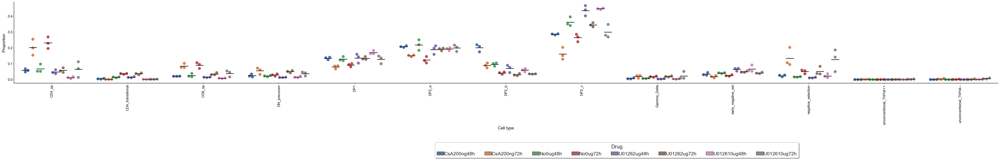

In [13]:
import seaborn as sns

df = pd.melt(scaled, id_vars=['Drug_Dose_Timepoint'], value_vars=values)

fig, ax = plt.subplots(figsize=(60,5))
sns.set("talk")
sns.set_style("white")

g = sns.boxplot(showmeans=True,
            meanline=True,
            meanprops={'color': 'k', 'ls': '-', 'lw': 2},
            medianprops={'visible': False},
            whiskerprops={'visible': False},
            zorder=10,
            x="variable",
            y="value",
            hue=df["Drug_Dose_Timepoint"],
            data=df,
            showfliers=False,
            showbox=False,
            showcaps=False,
            ax=ax)

d = sns.swarmplot(
    x='variable', y ='value', hue=df["Drug_Dose_Timepoint"], data=df, size=10, dodge=True, ax=ax)#, palette='Blues')

d.set_ylabel('Proportion')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')

handles, labels = ax.get_legend_handles_labels()
# When set legend in matplotlib use our modified handles and labels
plt.legend(ncol=8, loc='upper right', title="Drug",
           bbox_to_anchor=(0.8, -0.7),
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True,
           handles=handles[:8], labels=labels[:8],
          )


plt.show()

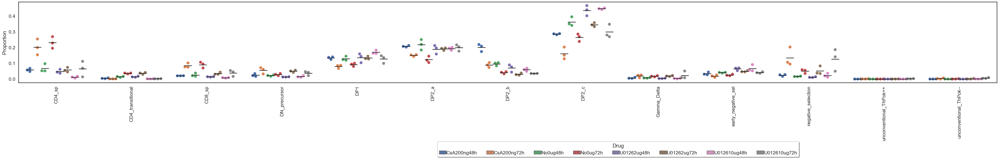

In [15]:
import seaborn as sns

df = pd.melt(scaled, id_vars=['Drug_Dose_Timepoint'], value_vars=values)

fig, ax = plt.subplots(figsize=(60,5))
sns.set("talk")
sns.set_style("white")

g = sns.boxplot(showmeans=True,
            meanline=True,
            meanprops={'color': 'k', 'ls': '-', 'lw': 2},
            medianprops={'visible': False},
            whiskerprops={'visible': False},
            zorder=10,
            x="variable",
            y="value",
            hue=df["Drug_Dose_Timepoint"],
            data=df,
            showfliers=False,
            showbox=False,
            showcaps=False,
            ax=ax)

d = sns.swarmplot(x='variable', y ='value', hue=df["Drug_Dose_Timepoint"], data=df, size=10, dodge=True, ax=ax)#, palette='Blues')

d.set_ylabel('Proportion')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')

handles, labels = ax.get_legend_handles_labels()
# When set legend in matplotlib use our modified handles and labels
plt.legend(ncol=8, loc='upper right', title="Drug",
           bbox_to_anchor=(0.8, -0.7),
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True,
           handles=handles[:8], labels=labels[:8],
          )


plt.show()

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4529: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4529: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4529: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base

[<matplotlib.patches.Rectangle object at 0x329177670>, <matplotlib.patches.Rectangle object at 0x32911ec40>, <matplotlib.patches.Rectangle object at 0x32911e580>, <matplotlib.patches.Rectangle object at 0x3290a9eb0>, <matplotlib.patches.Rectangle object at 0x3294e47c0>, <matplotlib.patches.Rectangle object at 0x32911ea60>, <matplotlib.patches.Rectangle object at 0x32952a8e0>, <matplotlib.patches.Rectangle object at 0x3294e4190>, <matplotlib.collections.PathCollection object at 0x317f83c10>, <matplotlib.collections.PathCollection object at 0x32a085bb0>, <matplotlib.collections.PathCollection object at 0x32a085f70>, <matplotlib.collections.PathCollection object at 0x32a09a400>, <matplotlib.collections.PathCollection object at 0x32a09a850>, <matplotlib.collections.PathCollection object at 0x32a09aca0>, <matplotlib.collections.PathCollection object at 0x32a09afa0>, <matplotlib.collections.PathCollection object at 0x32a0a1580>] ['CsA200ng48h', 'CsA200ng72h', 'No0ug48h', 'No0ug72h', 'U01262u

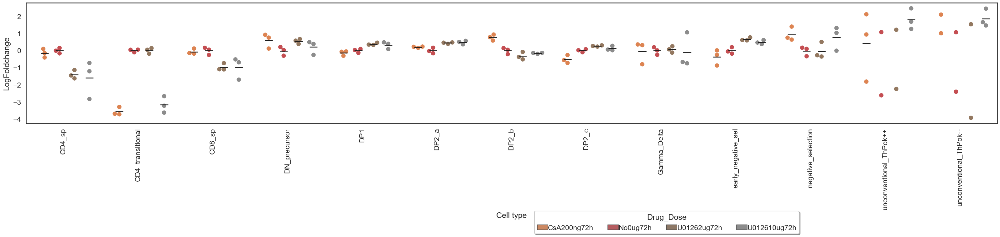

In [32]:
import seaborn as sns

scaled_logfc = scaled.iloc[[i for i, j in enumerate(scaled['Drug_Dose_Timepoint']) if "72h" in j]].copy()
scaled_logfc[values] = np.log(scaled_logfc[values]/scaled_logfc.loc[scaled_logfc["Drug_Dose_Timepoint"]=="No0ug72h", values].mean(0))

df = pd.melt(scaled_logfc, id_vars=['Drug_Dose_Timepoint'], value_vars=values)

fig, ax = plt.subplots(figsize=(40,5))
sns.set_style("white")

g = sns.boxplot(showmeans=True,
            meanline=True,
            meanprops={'color': 'k', 'ls': '-', 'lw': 2},
            medianprops={'visible': False},
            whiskerprops={'visible': False},
            zorder=10,
            x="variable",
            y="value",
            hue=df["Drug_Dose_Timepoint"],
            data=df,
            showfliers=False,
            showbox=False,
            showcaps=False,
            ax=ax)

d = sns.swarmplot(x='variable', y ='value', hue=df["Drug_Dose_Timepoint"], data=df, size=10, dodge=True, ax=ax)#, palette='Blues')

d.set_ylabel('LogFoldchange')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')

handles, labels = d.get_legend_handles_labels()
print(handles, labels)
# When set legend in matplotlib use our modified handles and labels
plt.legend(ncol=4, loc='upper right', title="Drug_Dose",
           bbox_to_anchor=(0.8, -0.7),
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True,
           handles=[handles[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
           labels=[labels[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
          )

plt.savefig('proportional_changes_all_72h.pdf', bbox_inches = "tight")
plt.savefig('proportional_changes_all_72h.svg', bbox_inches = "tight")
plt.show()
scaled_logfc.to_csv('logfc_72h.csv')

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/C

[<matplotlib.patches.Rectangle object at 0x32917d730>, <matplotlib.patches.Rectangle object at 0x2de2cbfd0>, <matplotlib.patches.Rectangle object at 0x32919f910>, <matplotlib.patches.Rectangle object at 0x3291bf9d0>, <matplotlib.patches.Rectangle object at 0x32919f8b0>, <matplotlib.patches.Rectangle object at 0x3291b9880>, <matplotlib.patches.Rectangle object at 0x3291bf8b0>, <matplotlib.patches.Rectangle object at 0x3291b96d0>, <matplotlib.collections.PathCollection object at 0x32917df10>, <matplotlib.collections.PathCollection object at 0x3293293d0>, <matplotlib.collections.PathCollection object at 0x32917dc10>, <matplotlib.collections.PathCollection object at 0x3292bd9a0>, <matplotlib.collections.PathCollection object at 0x329329970>, <matplotlib.collections.PathCollection object at 0x329329dc0>, <matplotlib.collections.PathCollection object at 0x329345250>, <matplotlib.collections.PathCollection object at 0x3293456d0>] ['CsA200ng48h', 'CsA200ng72h', 'No0ug48h', 'No0ug72h', 'U01262u

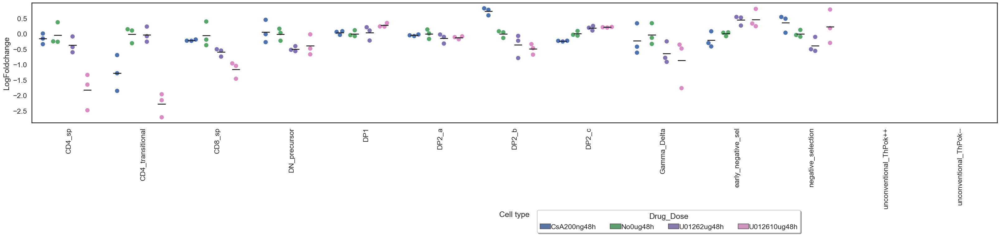

In [31]:
import seaborn as sns

scaled_logfc = scaled.iloc[[i for i, j in enumerate(scaled['Drug_Dose_Timepoint']) if "48h" in j]].copy()
scaled_logfc[values] = np.log(scaled_logfc[values]/scaled_logfc.loc[scaled_logfc["Drug_Dose_Timepoint"]=="No0ug48h", values].mean(0))

df = pd.melt(scaled_logfc, id_vars=['Drug_Dose_Timepoint'], value_vars=values)

fig, ax = plt.subplots(figsize=(40,5))
sns.set("talk")
sns.set_style("white")

g = sns.boxplot(showmeans=True,
            meanline=True,
            meanprops={'color': 'k', 'ls': '-', 'lw': 2},
            medianprops={'visible': False},
            whiskerprops={'visible': False},
            zorder=10,
            x="variable",
            y="value",
            hue=df["Drug_Dose_Timepoint"],
            data=df,
            showfliers=False,
            showbox=False,
            showcaps=False,
            ax=ax)

d = sns.swarmplot(x='variable', y ='value', hue=df["Drug_Dose_Timepoint"], data=df, size=10, dodge=True, ax=ax)#, palette='Blues')

d.set_ylabel('LogFoldchange')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')

handles, labels = d.get_legend_handles_labels()
print(handles, labels)
# When set legend in matplotlib use our modified handles and labels
plt.legend(ncol=4, loc='upper right', title="Drug_Dose",
           bbox_to_anchor=(0.8, -0.7),
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True,
           handles=[handles[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
           labels=[labels[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
          )


plt.savefig('proportional_changes_all_48h.pdf', bbox_inches = "tight")
plt.savefig('proportional_changes_all_48h.svg', bbox_inches = "tight")
plt.show()
scaled_logfc.to_csv('logfc_48h.csv')

/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/opt/homebrew/C

[<matplotlib.patches.Rectangle object at 0x17bb751f0>, <matplotlib.patches.Rectangle object at 0x16e48a3a0>, <matplotlib.patches.Rectangle object at 0x17bb20760>, <matplotlib.patches.Rectangle object at 0x16e37af40>, <matplotlib.patches.Rectangle object at 0x16e37ac70>, <matplotlib.patches.Rectangle object at 0x16e96a6d0>, <matplotlib.patches.Rectangle object at 0x17bb29070>, <matplotlib.patches.Rectangle object at 0x16e96a280>, <matplotlib.collections.PathCollection object at 0x16e974370>, <matplotlib.collections.PathCollection object at 0x17be5cbb0>, <matplotlib.collections.PathCollection object at 0x17be5cf70>, <matplotlib.collections.PathCollection object at 0x17be53400>, <matplotlib.collections.PathCollection object at 0x17be53850>, <matplotlib.collections.PathCollection object at 0x17be53ca0>, <matplotlib.collections.PathCollection object at 0x17be53fa0>, <matplotlib.collections.PathCollection object at 0x17be6f580>] ['CsA200ng48h', 'CsA200ng72h', 'No0ug48h', 'No0ug72h', 'U01262u

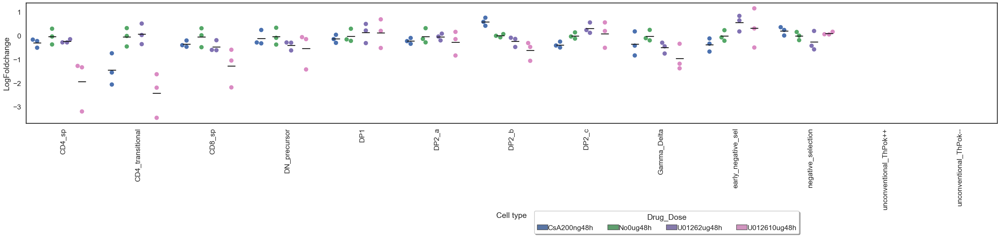

In [ ]:
import seaborn as sns

tmp_logfc = tmp.iloc[[i for i, j in enumerate(tmp['Drug_Dose_Timepoint']) if "48h" in j]].copy()
tmp_logfc[values] = np.log(
    tmp_logfc[values]/tmp_logfc.loc[tmp_logfc["Drug_Dose_Timepoint"]=="No0ug48h", values].mean(0))

df = pd.melt(tmp_logfc, id_vars=['Drug_Dose_Timepoint'], value_vars=values)

fig, ax = plt.subplots(figsize=(40,5))
sns.set("talk")
sns.set_style("white")

g = sns.boxplot(showmeans=True,
            meanline=True,
            meanprops={'color': 'k', 'ls': '-', 'lw': 2},
            medianprops={'visible': False},
            whiskerprops={'visible': False},
            zorder=10,
            x="variable",
            y="value",
            hue=df["Drug_Dose_Timepoint"],
            data=df,
            showfliers=False,
            showbox=False,
            showcaps=False,
            ax=ax)

d = sns.swarmplot(x='variable', y ='value', hue=df["Drug_Dose_Timepoint"], data=df, size=10, dodge=True, ax=ax)#, palette='Blues')

d.set_ylabel('LogFoldchange')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')

handles, labels = d.get_legend_handles_labels()
print(handles, labels)
# When set legend in matplotlib use our modified handles and labels
plt.legend(ncol=4, loc='upper right', title="Drug_Dose",
           bbox_to_anchor=(0.8, -0.7),
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True,
           handles=[handles[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
           labels=[labels[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
          )


plt.savefig('absolute_changes_proportional_all_48h.pdf', bbox_inches = "tight")
plt.savefig('absolute_changes_proportional_all_48h.svg', bbox_inches = "tight")
plt.show()

[<matplotlib.patches.Rectangle object at 0x2de2cb5e0>, <matplotlib.patches.Rectangle object at 0x315dcb340>, <matplotlib.patches.Rectangle object at 0x315d86250>, <matplotlib.patches.Rectangle object at 0x315def400>, <matplotlib.patches.Rectangle object at 0x315def310>, <matplotlib.patches.Rectangle object at 0x315d861f0>, <matplotlib.patches.Rectangle object at 0x315df5220>, <matplotlib.patches.Rectangle object at 0x315df5e50>, <matplotlib.collections.PathCollection object at 0x315d87d60>, <matplotlib.collections.PathCollection object at 0x317eced90>, <matplotlib.collections.PathCollection object at 0x315d87d30>, <matplotlib.collections.PathCollection object at 0x317ec05e0>, <matplotlib.collections.PathCollection object at 0x317ec0a30>, <matplotlib.collections.PathCollection object at 0x317ec0e80>, <matplotlib.collections.PathCollection object at 0x317eda310>, <matplotlib.collections.PathCollection object at 0x317eda760>] ['CsA200ng48h', 'CsA200ng72h', 'No0ug48h', 'No0ug72h', 'U01262u

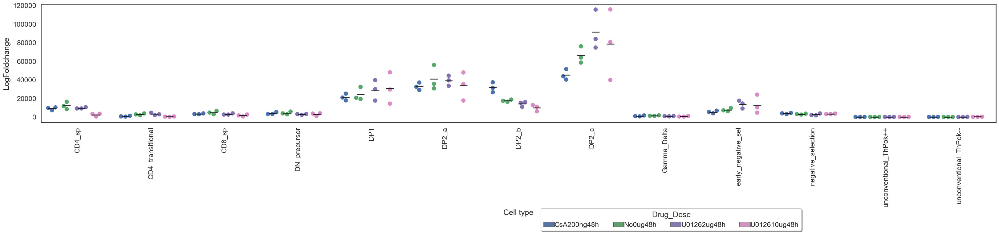

In [29]:
import seaborn as sns

tmp_logfc = tmp.iloc[[i for i, j in enumerate(tmp['Drug_Dose_Timepoint']) if "48h" in j]].copy()
df = pd.melt(tmp_logfc, id_vars=['Drug_Dose_Timepoint'], value_vars=values)

fig, ax = plt.subplots(figsize=(40,5))
sns.set("talk")
sns.set_style("white")

g = sns.boxplot(showmeans=True,
            meanline=True,
            meanprops={'color': 'k', 'ls': '-', 'lw': 2},
            medianprops={'visible': False},
            whiskerprops={'visible': False},
            zorder=10,
            x="variable",
            y="value",
            hue=df["Drug_Dose_Timepoint"],
            data=df,
            showfliers=False,
            showbox=False,
            showcaps=False,
            ax=ax)

d = sns.swarmplot(x='variable', y ='value', hue=df["Drug_Dose_Timepoint"], data=df, size=10, dodge=True, ax=ax)#, palette='Blues')

d.set_ylabel('LogFoldchange')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')

handles, labels = d.get_legend_handles_labels()
print(handles, labels)
# When set legend in matplotlib use our modified handles and labels
plt.legend(ncol=4, loc='upper right', title="Drug_Dose",
           bbox_to_anchor=(0.8, -0.7),
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True,
           handles=[handles[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
           labels=[labels[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
          )


plt.savefig('absolute_changes_all_48h.pdf', bbox_inches = "tight")
plt.savefig('absolute_changes_all_48h.svg', bbox_inches = "tight")
plt.show()

[<matplotlib.patches.Rectangle object at 0x32a122940>, <matplotlib.patches.Rectangle object at 0x2de048130>, <matplotlib.patches.Rectangle object at 0x32a2c5460>, <matplotlib.patches.Rectangle object at 0x32a2b1c70>, <matplotlib.patches.Rectangle object at 0x32a2c5850>, <matplotlib.patches.Rectangle object at 0x32a2b1b50>, <matplotlib.patches.Rectangle object at 0x32a137340>, <matplotlib.patches.Rectangle object at 0x32a1370a0>, <matplotlib.collections.PathCollection object at 0x32a122250>, <matplotlib.collections.PathCollection object at 0x32a1faa60>, <matplotlib.collections.PathCollection object at 0x32a1faeb0>, <matplotlib.collections.PathCollection object at 0x32a1faf70>, <matplotlib.collections.PathCollection object at 0x32a1fe550>, <matplotlib.collections.PathCollection object at 0x32a1fe9a0>, <matplotlib.collections.PathCollection object at 0x32a1fedf0>, <matplotlib.collections.PathCollection object at 0x32a20a280>] ['CsA200ng48h', 'CsA200ng72h', 'No0ug48h', 'No0ug72h', 'U01262u

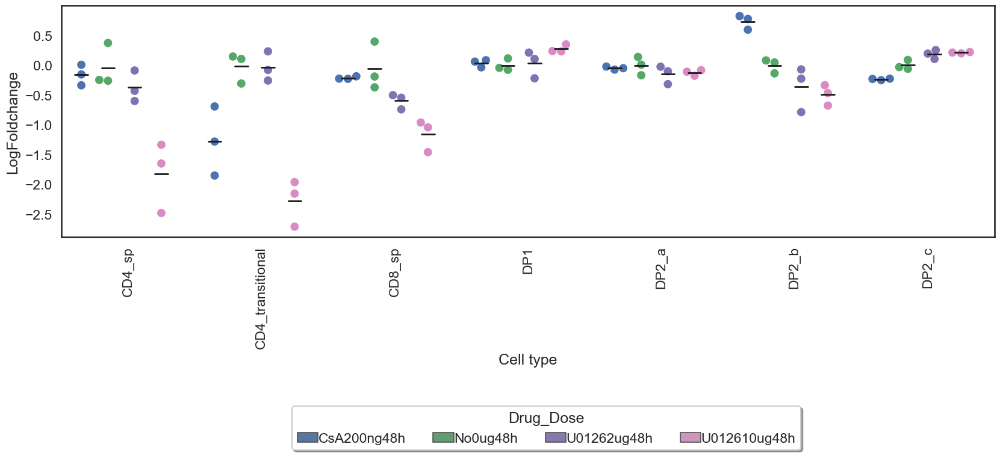

: 

In [33]:
import seaborn as sns

scaled_logfc = scaled.iloc[[i for i, j in enumerate(scaled['Drug_Dose_Timepoint']) if "48h" in j]].copy()
scaled_logfc[values] = np.log(scaled_logfc[values]/scaled_logfc.loc[scaled_logfc["Drug_Dose_Timepoint"]=="No0ug48h", values].mean(0))

df = pd.melt(scaled_logfc, id_vars=['Drug_Dose_Timepoint'], value_vars=values)
df = df[df.variable.isin(['DP1', 'DP2_b', 'DP2_a', 'CD8_sp', 'DP2_c', 'CD4_transitional', 'CD4_sp'])]

fig, ax = plt.subplots(figsize=(20,5))
sns.set("talk")
sns.set_style("white")

g = sns.boxplot(showmeans=True,
            meanline=True,
            meanprops={'color': 'k', 'ls': '-', 'lw': 2},
            medianprops={'visible': False},
            whiskerprops={'visible': False},
            zorder=10,
            x="variable",
            y="value",
            hue=df["Drug_Dose_Timepoint"],
            data=df,
            showfliers=False,
            showbox=False,
            showcaps=False,
            ax=ax)

d = sns.swarmplot(x='variable', y ='value', hue=df["Drug_Dose_Timepoint"], data=df, size=10, dodge=True, ax=ax)#, palette='Blues')

d.set_ylabel('LogFoldchange')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')

handles, labels = d.get_legend_handles_labels()
print(handles, labels)
# When set legend in matplotlib use our modified handles and labels
plt.legend(ncol=4, loc='upper right', title="Drug_Dose",
           bbox_to_anchor=(0.8, -0.7),
           handletextpad=0.0, handlelength=1.5,
           fancybox=True, shadow=True,
           handles=[handles[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
           labels=[labels[i] for i in np.sort(df['Drug_Dose_Timepoint'].cat.codes.unique())],
          )

plt.savefig('proportional_changes_subset_48h.svg', bbox_inches = "tight")
plt.savefig('proportional_changes_subset_48h.pdf', bbox_inches = "tight")
plt.show()
scaled_logfc.to_csv('logfc_48h_sub.csv')

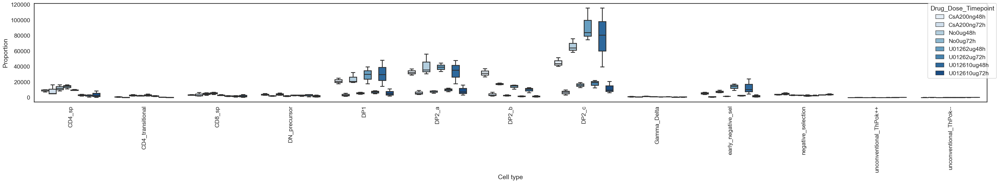

In [ ]:
import seaborn as sns

df = pd.melt(tmp, id_vars=['Drug_Dose_Timepoint'], value_vars=values)

fig, ax = plt.subplots(figsize=(48,5))
d = sns.boxplot(x='variable', y = 'value', hue=df["Drug_Dose_Timepoint"], data=df, fliersize=1,
               palette='Blues')

d.set_ylabel('Proportion')
loc, labels = plt.xticks()
d.set_xticklabels(labels, rotation=90)
d.set_xlabel('Cell type')
#d.set_ylim([0,0.5])
plt.legend(bbox_to_anchor=(1.01, 1), borderaxespad=0., title="Drug_Dose_Timepoint")
plt.show()

In [10]:
os.mkdir('pairplots')

Inspect pairplots to confirm clustering

CD4_sp


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
24508,588969-4,0.493695,0.759972,0.386251,0.799580,0.727192,0.660712,0.485491,0.744187,0.600928,0.818803,CD4_transitional,other
44448,588294-4,0.374055,0.594447,0.412319,0.564210,0.691846,0.442504,0.721680,0.762289,0.601737,0.802236,DP2_b,other
44113,805997,0.374934,0.635783,0.415891,0.590411,0.680077,0.515010,0.720706,0.723704,0.602098,0.794338,DP2_b,other
16953,294795-7,0.367244,0.512144,0.422676,0.685419,0.655861,0.570095,0.734968,0.762406,0.611561,0.839644,DP2_c,other
1669,610391-2,0.410770,0.579000,0.375401,0.609602,0.711372,0.308659,0.727413,0.755556,0.581281,0.797134,DP1,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51288,261689-8,0.582826,0.613589,0.399404,0.686301,0.722140,0.277026,0.295966,0.733727,0.518754,0.580139,CD4_sp,CD4_sp
55156,268321-7,0.626855,0.562048,0.375691,0.809357,0.776200,0.558834,0.190513,0.788457,0.467199,0.735219,CD4_sp,CD4_sp
51459,307483-3,0.615218,0.598093,0.436977,0.781722,0.795461,0.561813,0.388171,0.756058,0.554194,0.762265,CD4_sp,CD4_sp
53763,634262-4,0.594051,0.556522,0.523524,0.743193,0.746935,0.477114,0.415442,0.732618,0.455636,0.653914,CD4_sp,CD4_sp


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


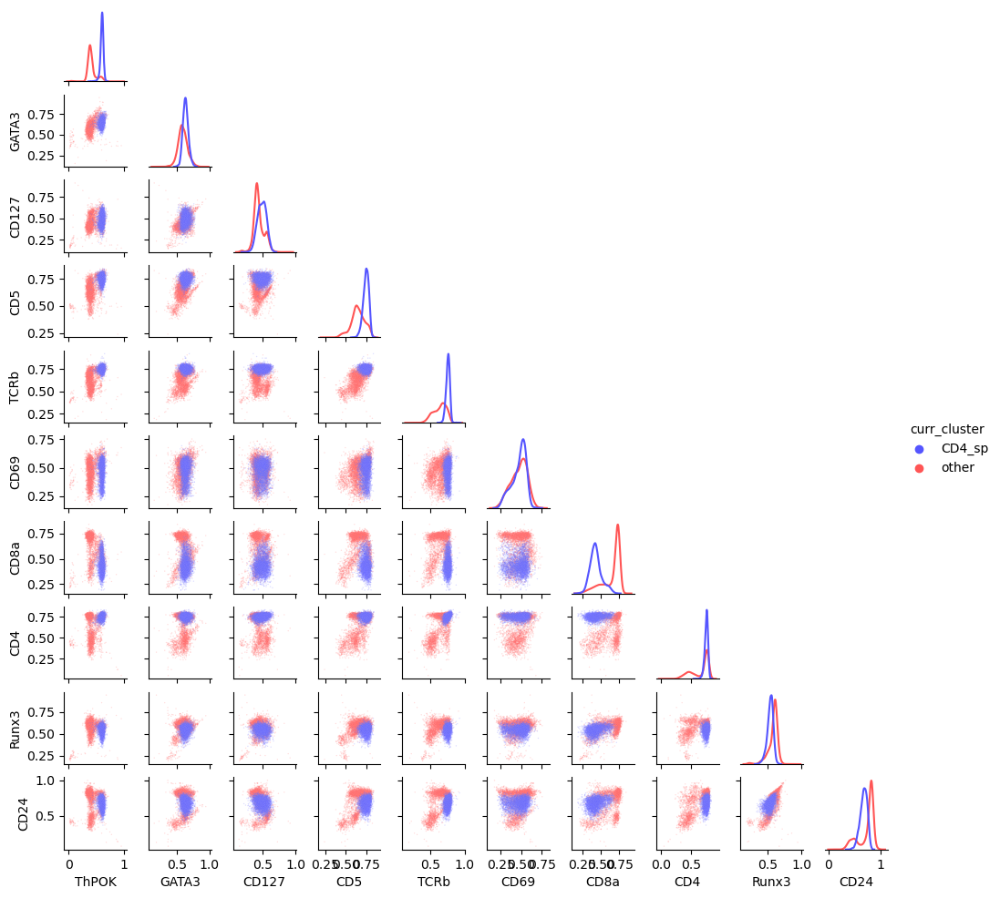

CD4_transitional


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
6521,681449-2,0.348486,0.547701,0.396504,0.691427,0.610135,0.440831,0.725653,0.769218,0.611796,0.815511,DP2_a,other
46198,387000-6,0.363591,0.546356,0.384759,0.592404,0.605282,0.549597,0.710074,0.750604,0.625960,0.843003,early_negative_sel,other
46542,309528-5,0.372515,0.563422,0.385294,0.682430,0.563299,0.529728,0.727093,0.775321,0.625474,0.840605,early_negative_sel,other
37405,363531-6,0.401256,0.523868,0.438086,0.488971,0.516936,0.466142,0.399413,0.317260,0.396069,0.475967,negative_selection,other
9064,433769-3,0.389467,0.641614,0.447493,0.675716,0.656172,0.369222,0.714762,0.724414,0.579549,0.786368,DP2_a,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20464,463954-10,0.612709,0.583714,0.495483,0.776800,0.789161,0.613969,0.513143,0.813323,0.608678,0.822395,CD4_transitional,CD4_transitional
22562,150019-5,0.494967,0.732889,0.440307,0.761718,0.732181,0.576505,0.663764,0.719268,0.642597,0.848574,CD4_transitional,CD4_transitional
21778,285207-7,0.611583,0.743698,0.421449,0.807514,0.735473,0.639933,0.488234,0.752688,0.603767,0.806420,CD4_transitional,CD4_transitional
21227,859587,0.601924,0.642095,0.433641,0.807969,0.776727,0.629536,0.463768,0.752792,0.570767,0.789008,CD4_transitional,CD4_transitional


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


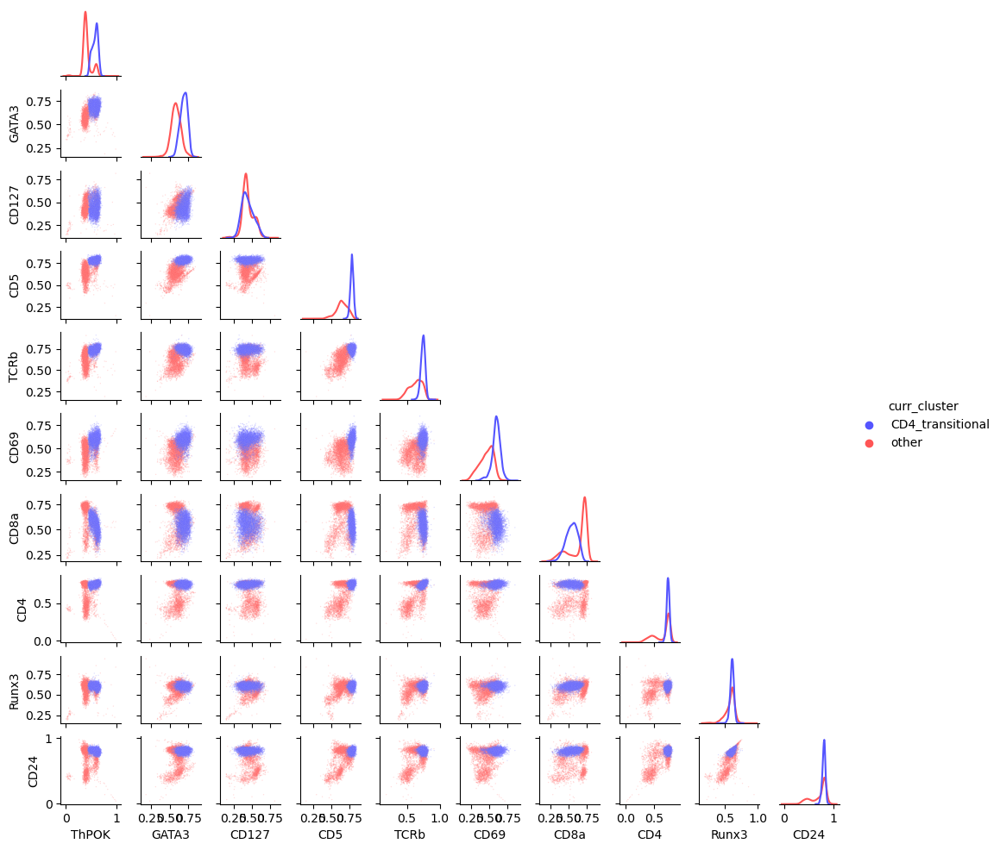

CD8_sp


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
20105,580759-6,0.536731,0.690368,0.401934,0.784461,0.710862,0.611005,0.621395,0.744698,0.566874,0.793834,CD4_transitional,other
3359,743303-1,0.386291,0.461663,0.397286,0.621128,0.591618,0.259800,0.748072,0.776872,0.621262,0.819625,DP1,other
9957,74341,0.400391,0.579582,0.424430,0.694643,0.706512,0.368612,0.718022,0.755905,0.564408,0.779835,DP2_a,other
23678,607359-4,0.576871,0.715969,0.521485,0.773736,0.733648,0.512465,0.558637,0.782470,0.616919,0.779643,CD4_transitional,other
18708,514285-4,0.410956,0.525674,0.400340,0.691717,0.621938,0.467119,0.693824,0.761844,0.637276,0.855382,DP2_c,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14708,402840-2,0.384981,0.538797,0.477797,0.682756,0.801633,0.422088,0.730919,0.628350,0.629017,0.789982,CD8_sp,CD8_sp
11327,156555-5,0.426672,0.589043,0.486089,0.671585,0.788330,0.307328,0.733484,0.409426,0.617473,0.720953,CD8_sp,CD8_sp
12231,686345,0.424168,0.619743,0.499375,0.671059,0.733351,0.436436,0.726354,0.592187,0.641088,0.745562,CD8_sp,CD8_sp
14097,338476-2,0.573578,0.624408,0.429163,0.696794,0.780263,0.429923,0.661107,0.746695,0.553705,0.700198,CD8_sp,CD8_sp


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


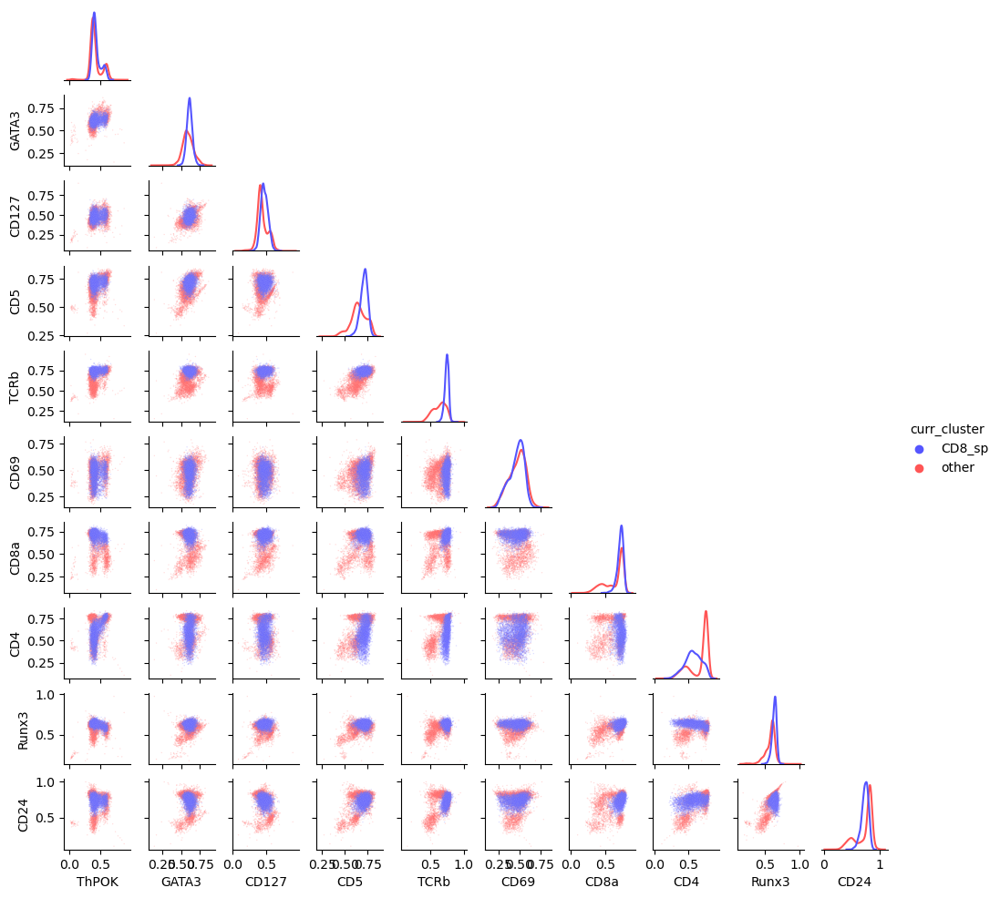

DN_precursor


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
17900,447562-3,0.389187,0.554525,0.421039,0.650227,0.674587,0.495357,0.740653,0.753938,0.561356,0.799729,DP2_c,other
14545,131256-1,0.399622,0.569026,0.496839,0.681344,0.761395,0.344657,0.731287,0.646744,0.628884,0.755264,CD8_sp,other
25465,334975-2,0.445637,0.636983,0.572206,0.631959,0.489659,0.533017,0.723271,0.430656,0.538583,0.561861,Gamma_Delta,other
12252,632192-1,0.353084,0.556335,0.487752,0.689156,0.788881,0.474519,0.733997,0.606627,0.617569,0.769220,CD8_sp,other
37700,374657-11,0.453244,0.516795,0.446099,0.472406,0.523961,0.399582,0.431056,0.431429,0.411899,0.407957,negative_selection,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33431,434433,0.422059,0.673318,0.416730,0.696981,0.725153,0.600424,0.497060,0.590162,0.663568,0.886608,DN_precursor,DN_precursor
32504,580089,0.368378,0.617805,0.546280,0.576281,0.597169,0.494278,0.404223,0.408830,0.648409,0.701887,DN_precursor,DN_precursor
33007,344065,0.341737,0.611976,0.486115,0.568148,0.532421,0.350613,0.454936,0.502039,0.520100,0.705806,DN_precursor,DN_precursor
34785,561610,0.507742,0.541453,0.365027,0.540417,0.488330,0.487829,0.328334,0.329885,0.618863,0.829125,DN_precursor,DN_precursor


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


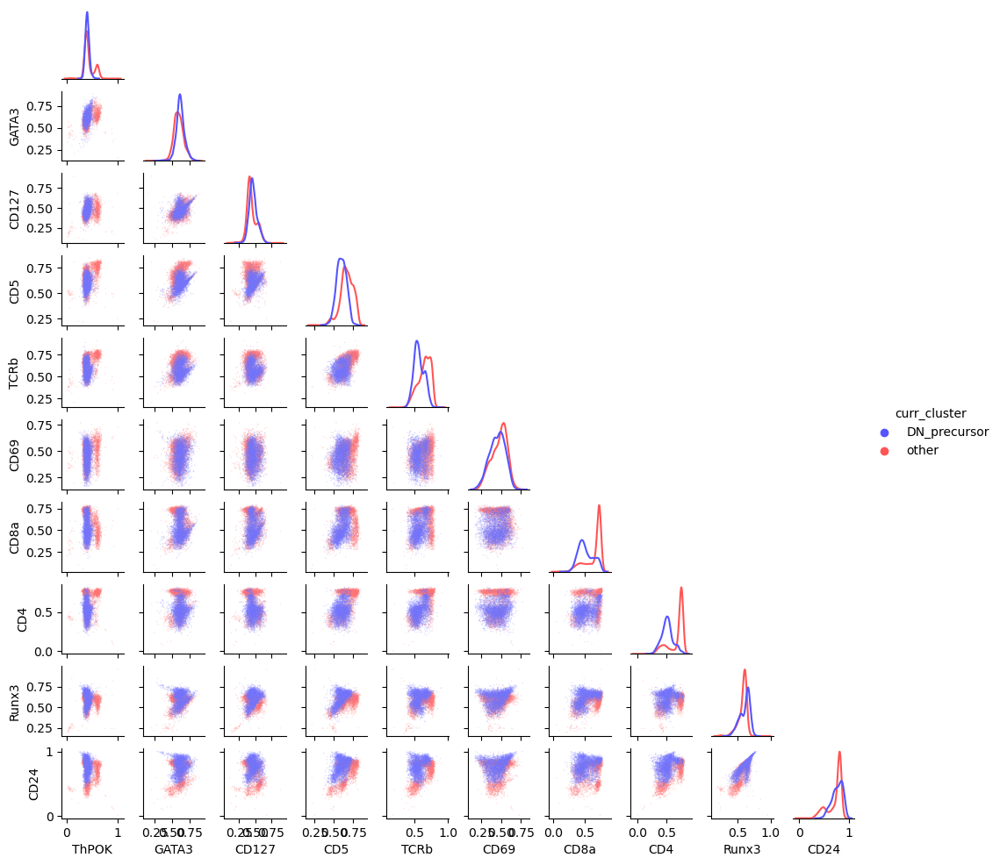

DP1


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
37682,194314-6,0.647708,0.703514,0.385324,0.532605,0.649772,0.465397,0.275726,0.494957,0.579932,0.526165,negative_selection,other
8058,92862-2,0.331032,0.550470,0.396359,0.657279,0.658775,0.429238,0.735343,0.766597,0.593724,0.811755,DP2_a,other
17445,482289-6,0.374679,0.500153,0.309286,0.715528,0.680662,0.428621,0.703882,0.731344,0.611955,0.821095,DP2_c,other
41397,19660-1,0.331050,0.506490,0.339038,0.647106,0.718222,0.578830,0.722696,0.754818,0.590152,0.816201,DP2_b,other
7923,713121-4,0.390037,0.523576,0.459909,0.691474,0.698320,0.355990,0.729234,0.768555,0.616825,0.840136,DP2_a,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2648,374358-3,0.414241,0.524141,0.432380,0.700250,0.628438,0.354730,0.749050,0.746007,0.590753,0.806755,DP1,DP1
1886,225438-5,0.325789,0.530208,0.369331,0.623782,0.636226,0.338375,0.713070,0.759020,0.608752,0.811348,DP1,DP1
300,548582-5,0.347713,0.604772,0.421834,0.715463,0.684009,0.326148,0.746137,0.768754,0.636583,0.834266,DP1,DP1
3249,607595-3,0.299140,0.577542,0.379081,0.568188,0.662881,0.275377,0.756694,0.787526,0.656566,0.853379,DP1,DP1


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


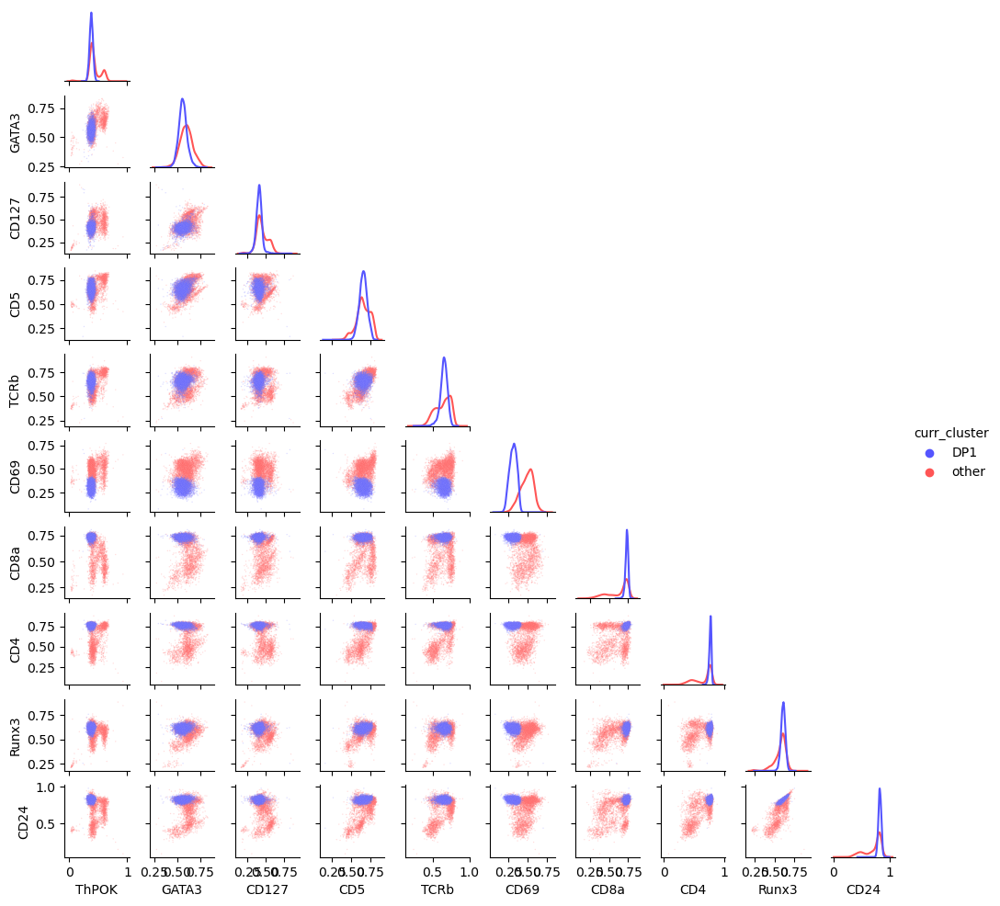

DP2_a


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
11505,574130-3,0.382720,0.606175,0.461769,0.710426,0.751227,0.463426,0.689171,0.472506,0.626887,0.715143,CD8_sp,other
341,235747-5,0.362359,0.613570,0.454896,0.650410,0.635273,0.277529,0.733294,0.779434,0.626380,0.819495,DP1,other
27213,536690-1,0.393415,0.578154,0.545782,0.591856,0.507925,0.416212,0.691656,0.413248,0.515908,0.472082,Gamma_Delta,other
42512,466601-8,0.373733,0.534638,0.414889,0.612001,0.719084,0.547319,0.702394,0.783851,0.587206,0.807042,DP2_b,other
35953,191591-5,0.536209,0.554803,0.429201,0.492049,0.467526,0.337641,0.466069,0.423902,0.456792,0.436877,negative_selection,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9843,500987-6,0.420022,0.509092,0.367831,0.656855,0.640494,0.438333,0.714484,0.753441,0.546619,0.766768,DP2_a,DP2_a
8083,318542-3,0.393711,0.596714,0.379547,0.678678,0.541199,0.287676,0.675768,0.730794,0.547377,0.752684,DP2_a,DP2_a
8761,474710-6,0.441865,0.492328,0.404105,0.696491,0.645086,0.410001,0.770308,0.772531,0.614656,0.840060,DP2_a,DP2_a
9947,360497-6,0.373678,0.612266,0.453485,0.698901,0.672984,0.436572,0.747453,0.773073,0.647734,0.871045,DP2_a,DP2_a


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


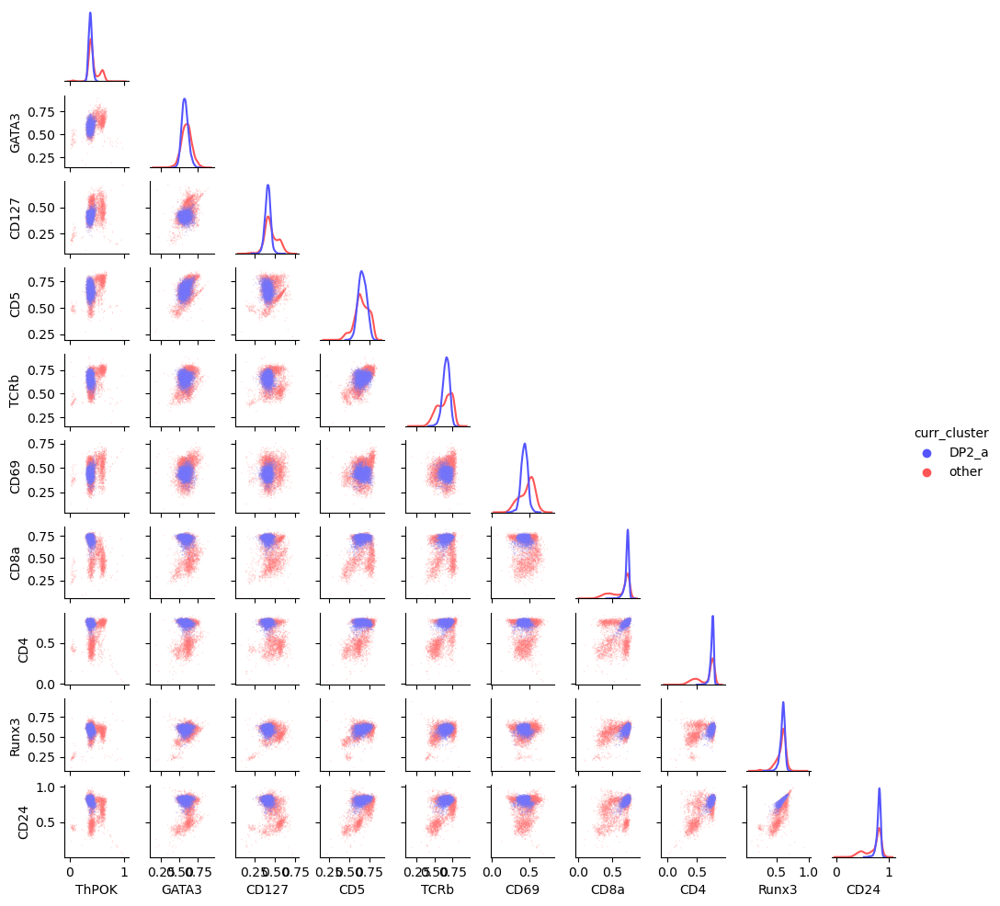

DP2_b


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
12902,608957-2,0.470206,0.614980,0.533664,0.710403,0.757206,0.278447,0.785228,0.651211,0.615572,0.784908,CD8_sp,other
34334,572569-3,0.435683,0.577248,0.459378,0.501549,0.524661,0.545678,0.471830,0.472933,0.500415,0.687194,DN_precursor,other
29646,370617-3,0.401007,0.579649,0.540484,0.602005,0.544716,0.369809,0.703300,0.526637,0.503610,0.468562,Gamma_Delta,other
20004,310625-4,0.585799,0.664744,0.411800,0.797470,0.717178,0.609228,0.563174,0.739659,0.596455,0.798353,CD4_transitional,other
11663,694924-1,0.380325,0.620011,0.436966,0.663495,0.756335,0.526107,0.726756,0.568659,0.605767,0.732658,CD8_sp,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42967,221143,0.393385,0.522222,0.377939,0.595012,0.732151,0.607824,0.736701,0.783422,0.594081,0.798190,DP2_b,DP2_b
44622,563447,0.418941,0.587610,0.420123,0.622215,0.640344,0.597653,0.749603,0.796334,0.601116,0.827195,DP2_b,DP2_b
45587,47078,0.395077,0.526779,0.362640,0.614460,0.757476,0.582752,0.715062,0.755516,0.627757,0.839465,DP2_b,DP2_b
43686,14191-1,0.394513,0.494727,0.424450,0.565391,0.680757,0.444587,0.704712,0.741808,0.556762,0.789549,DP2_b,DP2_b


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


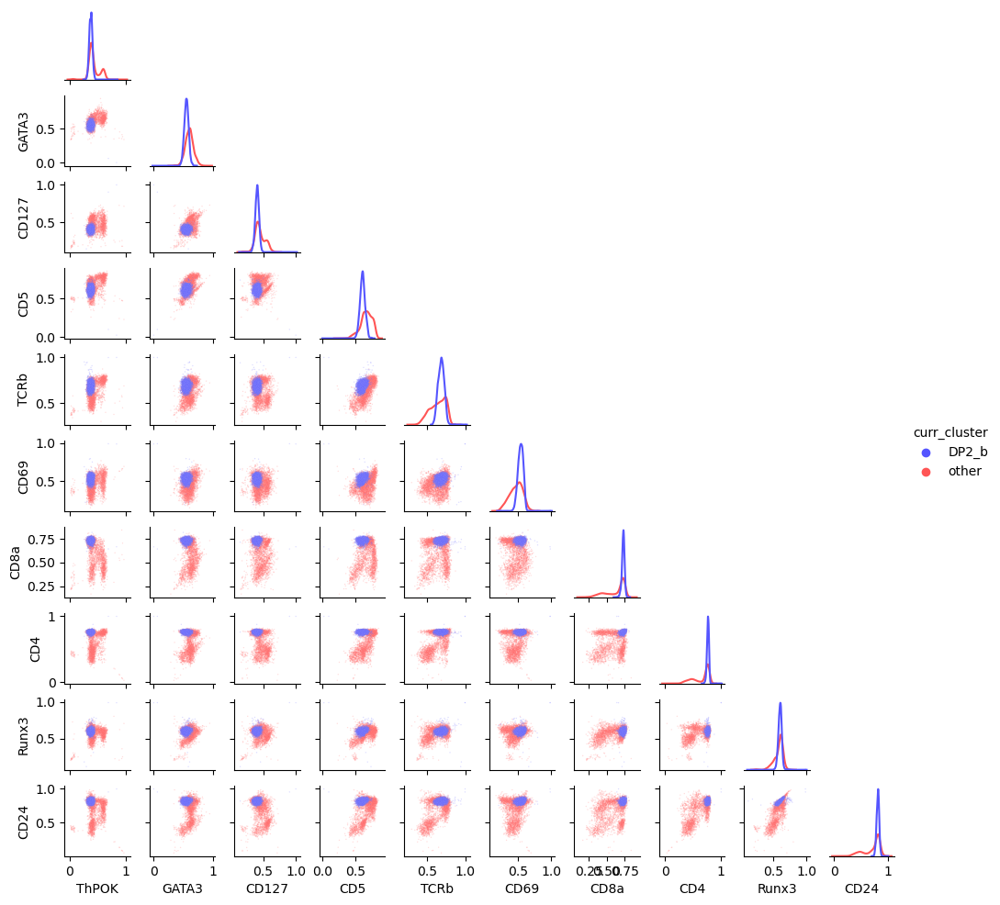

DP2_c


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
38213,448711-4,0.400696,0.513503,0.356987,0.483010,0.484207,0.384140,0.283290,0.342455,0.449625,0.457241,negative_selection,other
311,279038-4,0.373419,0.519457,0.414323,0.652444,0.547270,0.336231,0.726777,0.771872,0.633438,0.834479,DP1,other
27621,905748,0.424132,0.620643,0.577780,0.631626,0.510622,0.453289,0.683937,0.516669,0.534510,0.551623,Gamma_Delta,other
12900,149947,0.412879,0.609923,0.492477,0.627110,0.748987,0.415820,0.744564,0.515731,0.674871,0.828968,CD8_sp,other
11218,188841-1,0.400627,0.707572,0.438659,0.711911,0.771671,0.496312,0.738613,0.593091,0.659808,0.713369,CD8_sp,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15766,5550-3,0.388352,0.591264,0.453203,0.717329,0.667877,0.525771,0.726237,0.741750,0.590105,0.796216,DP2_c,DP2_c
16507,185162-4,0.401366,0.571761,0.388765,0.643809,0.655811,0.577109,0.733881,0.781434,0.626998,0.833172,DP2_c,DP2_c
16822,533104-5,0.403799,0.472389,0.387268,0.639742,0.624318,0.495946,0.668738,0.752991,0.598016,0.800859,DP2_c,DP2_c
16463,137285-7,0.367578,0.563792,0.463207,0.677291,0.698121,0.591782,0.709536,0.772197,0.628051,0.833888,DP2_c,DP2_c


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


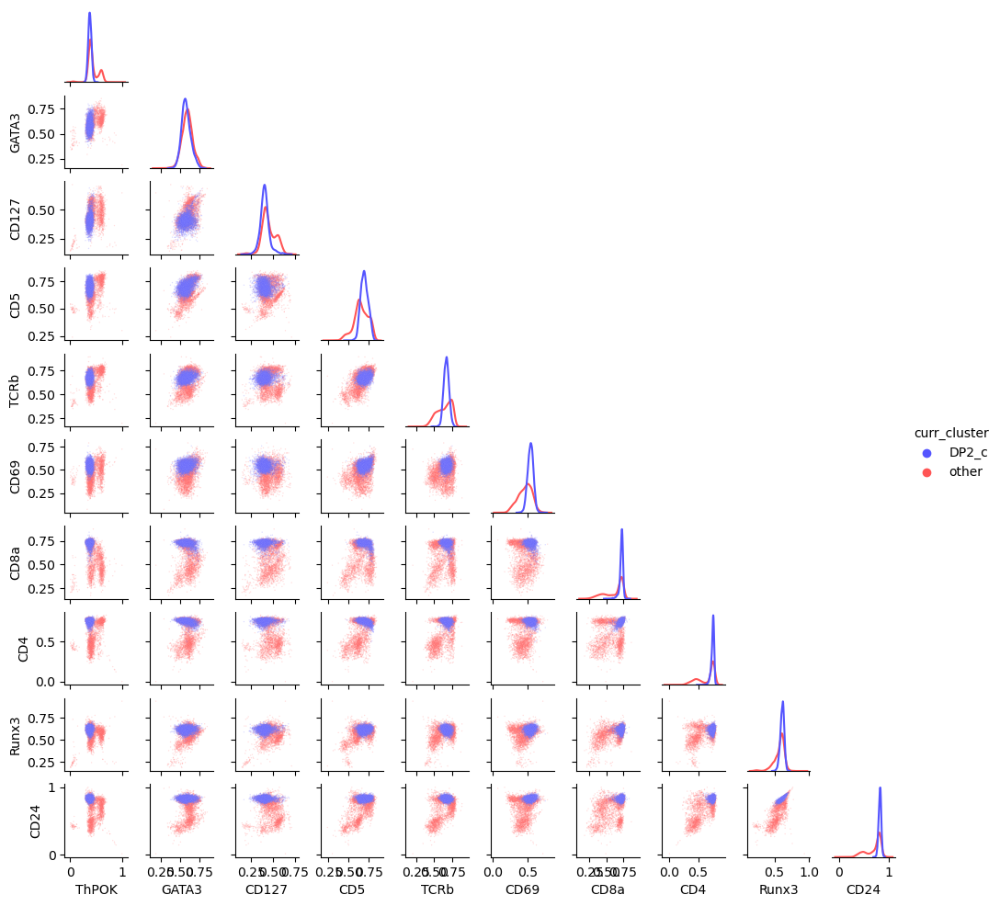

Gamma_Delta


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
47203,444014,0.368717,0.620392,0.409414,0.633360,0.606231,0.503071,0.730079,0.774174,0.562221,0.789364,early_negative_sel,other
3226,530053-3,0.347007,0.530284,0.405004,0.692180,0.689568,0.200454,0.737273,0.736288,0.616732,0.834553,DP1,other
38736,175417-4,0.412948,0.524295,0.421550,0.507017,0.536974,0.389170,0.480889,0.335182,0.466565,0.402730,negative_selection,other
7717,196705-1,0.414124,0.541635,0.382780,0.588215,0.707292,0.474121,0.730330,0.788197,0.599965,0.832909,DP2_a,other
7594,551140-6,0.388893,0.549183,0.411271,0.651194,0.605202,0.481301,0.750866,0.788837,0.609684,0.801859,DP2_a,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29403,110408-3,0.401411,0.611476,0.544072,0.593144,0.528051,0.498232,0.694698,0.494728,0.476820,0.477366,Gamma_Delta,Gamma_Delta
27876,131444-3,0.346091,0.605081,0.566642,0.616084,0.533172,0.481915,0.732944,0.462433,0.523099,0.477971,Gamma_Delta,Gamma_Delta
29735,322037-4,0.371168,0.626157,0.572690,0.625851,0.540643,0.478961,0.720797,0.530212,0.522127,0.604100,Gamma_Delta,Gamma_Delta
29665,101292-3,0.408593,0.641380,0.566987,0.618425,0.537107,0.422913,0.719854,0.528920,0.556446,0.461821,Gamma_Delta,Gamma_Delta


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


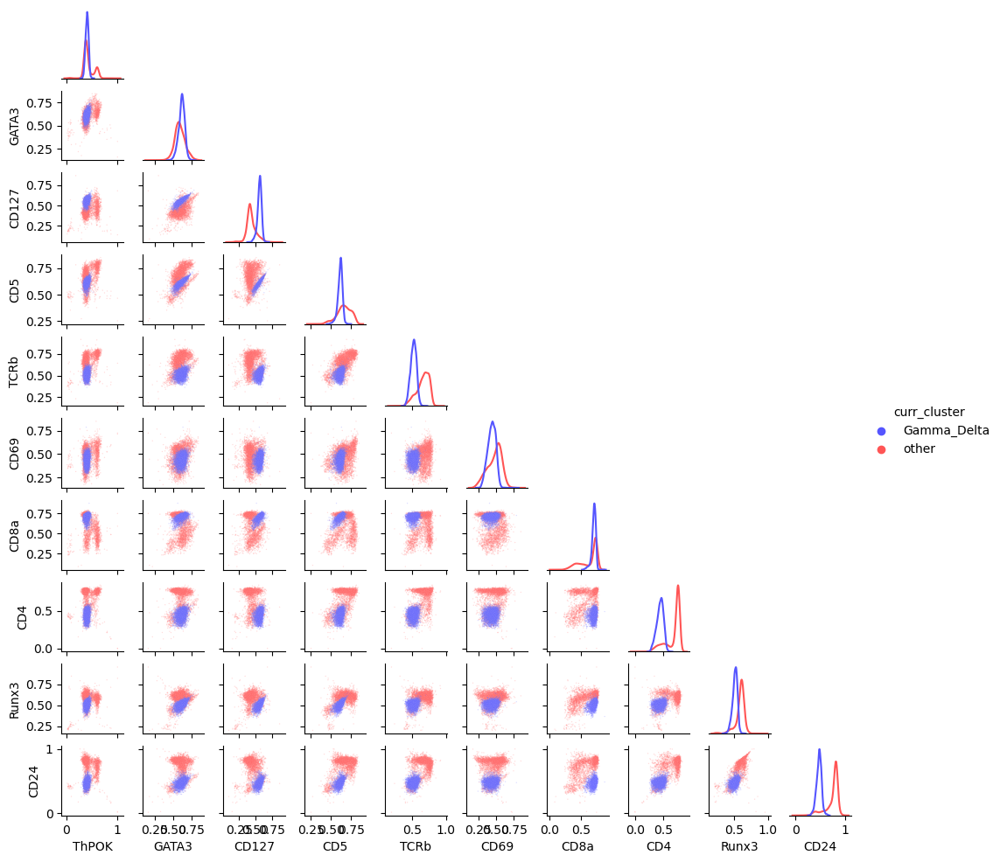

early_negative_sel


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
22883,378870-5,0.611817,0.690580,0.326557,0.799360,0.714815,0.607093,0.434182,0.751693,0.629331,0.852208,CD4_transitional,other
10217,449852-4,0.586809,0.613630,0.552862,0.711308,0.756096,0.573894,0.709597,0.793369,0.583004,0.789674,CD8_sp,other
28032,465686,0.408815,0.687819,0.623892,0.659698,0.591832,0.420057,0.728380,0.546113,0.529442,0.534070,Gamma_Delta,other
43119,628489,0.394901,0.562216,0.441923,0.598408,0.685667,0.531603,0.741608,0.753253,0.583664,0.828423,DP2_b,other
19150,61958-3,0.362684,0.569393,0.351811,0.756967,0.685527,0.525732,0.763923,0.768656,0.649999,0.857678,DP2_c,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47414,106981-1,0.361246,0.539321,0.391151,0.762056,0.441471,0.618100,0.720616,0.732694,0.633833,0.849049,early_negative_sel,early_negative_sel
49601,587186-2,0.394414,0.562794,0.384122,0.627696,0.595158,0.556890,0.743215,0.775804,0.602552,0.807829,early_negative_sel,early_negative_sel
48080,533427,0.384270,0.541630,0.388543,0.663540,0.594477,0.502453,0.740755,0.764304,0.584013,0.781516,early_negative_sel,early_negative_sel
46715,892624-1,0.370714,0.547129,0.391602,0.625530,0.588761,0.508392,0.727095,0.765644,0.572496,0.783709,early_negative_sel,early_negative_sel


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


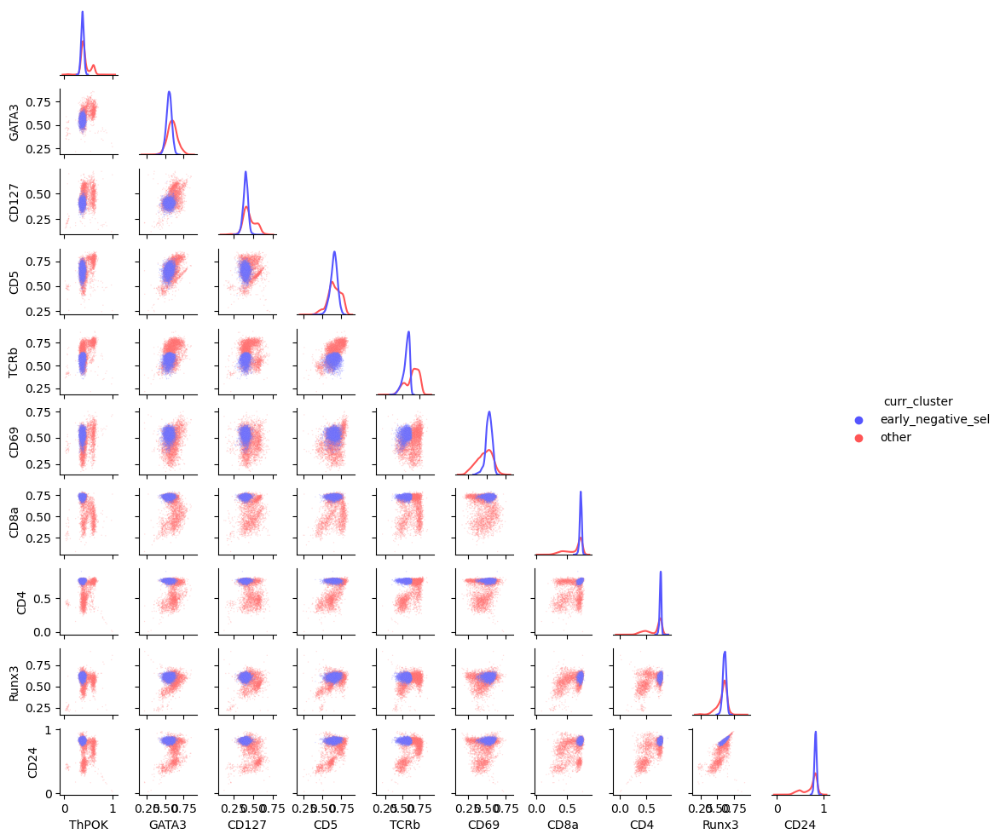

negative_selection


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
26114,53870,0.395127,0.626388,0.569795,0.629024,0.564809,0.445081,0.689054,0.465843,0.512721,0.546876,Gamma_Delta,other
12823,265967-7,0.412705,0.602660,0.420385,0.732713,0.701350,0.572511,0.711290,0.359674,0.654493,0.771761,CD8_sp,other
51488,695666,0.529363,0.673946,0.456441,0.683882,0.740153,0.347521,0.639216,0.773234,0.609349,0.726804,CD4_sp,other
3977,360947-2,0.406741,0.607300,0.453868,0.638403,0.709563,0.251064,0.728917,0.748913,0.574105,0.807374,DP1,other
41203,177629,0.404779,0.557433,0.402807,0.629440,0.676748,0.542572,0.734347,0.787351,0.602018,0.816943,DP2_b,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
38220,274743-2,0.435988,0.637259,0.517362,0.573247,0.579764,0.519521,0.558822,0.520839,0.486261,0.466663,negative_selection,negative_selection
36323,336150,0.368731,0.474885,0.367887,0.495720,0.439273,0.385125,0.410933,0.404281,0.468155,0.328109,negative_selection,negative_selection
39242,75509-4,0.403436,0.443300,0.372698,0.458176,0.490312,0.395428,0.335552,0.382680,0.440118,0.367466,negative_selection,negative_selection
35649,242480-2,0.414403,0.482730,0.371168,0.444116,0.454113,0.284876,0.305345,0.349035,0.415548,0.445091,negative_selection,negative_selection


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


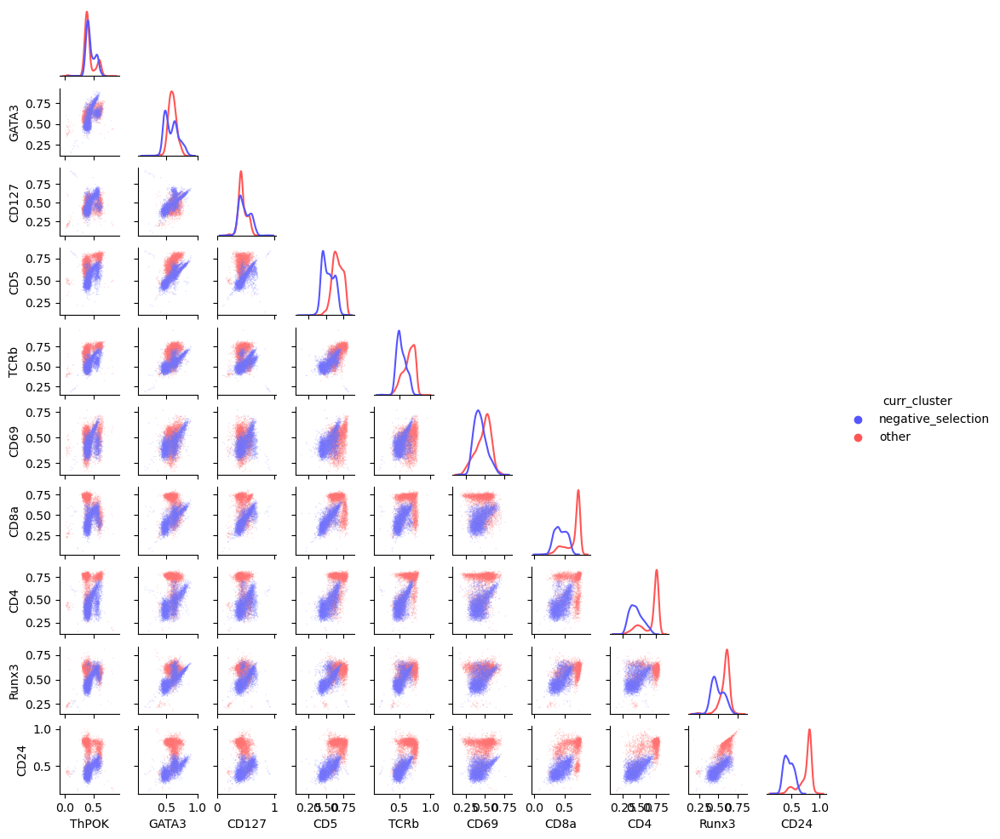

unconventional_ThPok++


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
40564,852607-1,0.951256,0.176734,0.223479,0.429572,0.173711,0.687663,0.325402,0.050051,0.956346,0.045702,unconventional_ThPok++,unconventional_ThPok++
40512,629715,0.561211,0.430242,0.280745,0.462762,0.411046,0.399247,0.264219,0.344711,0.251630,0.379703,unconventional_ThPok++,unconventional_ThPok++
40611,612112-4,0.943960,0.411164,0.188750,0.469940,0.419153,0.662514,0.712257,0.057823,0.229209,0.081521,unconventional_ThPok++,unconventional_ThPok++
40527,880220-1,0.860985,0.367438,0.144794,0.521529,0.406752,0.611813,0.344488,0.150606,0.711052,0.173250,unconventional_ThPok++,unconventional_ThPok++
40498,605976-6,0.822906,0.433594,0.216881,0.484595,0.409287,0.548295,0.509903,0.189237,0.583513,0.213532,unconventional_ThPok++,unconventional_ThPok++
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18426,689676-2,0.386645,0.699098,0.432125,0.748993,0.621885,0.558781,0.745443,0.738463,0.645599,0.853531,DP2_c,other
3766,545864-5,0.432678,0.587798,0.447472,0.711107,0.575814,0.358496,0.759276,0.781698,0.618812,0.828380,DP1,other
30988,600601-5,0.399800,0.616600,0.534695,0.635839,0.516252,0.224139,0.576892,0.407179,0.711405,0.853833,DN_precursor,other
49383,634458-5,0.441594,0.590857,0.353110,0.693410,0.602328,0.509635,0.706300,0.763364,0.608266,0.825481,early_negative_sel,other


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


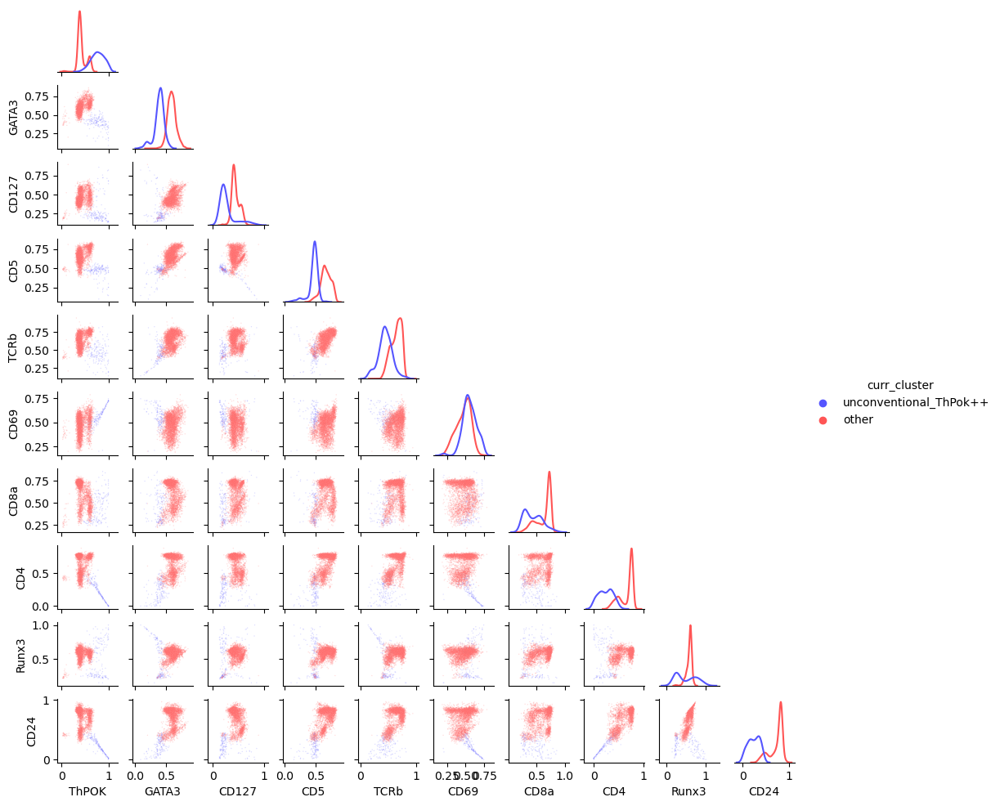

unconventional_ThPok--


Staining,level_1,ThPOK,GATA3,CD127,CD5,TCRb,CD69,CD8a,CD4,Runx3,CD24,pheno,curr_cluster
40195,708385-3,0.082275,0.415178,0.252602,0.485168,0.416237,0.366148,0.301899,0.413917,0.293257,0.440139,unconventional_ThPok--,unconventional_ThPok--
40042,635337,0.079434,0.420528,0.297726,0.468741,0.419081,0.468500,0.281208,0.442094,0.299133,0.368493,unconventional_ThPok--,unconventional_ThPok--
40477,874273-2,0.088653,0.464734,0.232140,0.482993,0.618262,0.465527,0.314388,0.422017,0.270165,0.473209,unconventional_ThPok--,unconventional_ThPok--
40331,677781-3,0.064648,0.399084,0.380579,0.428965,0.419105,0.357758,0.232397,0.424220,0.242336,0.380269,unconventional_ThPok--,unconventional_ThPok--
40030,841388-1,0.028241,0.378854,0.198700,0.502254,0.659782,0.334212,0.225301,0.439490,0.207437,0.373688,unconventional_ThPok--,unconventional_ThPok--
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20283,486617-5,0.502603,0.671248,0.373111,0.801126,0.671929,0.624481,0.661770,0.720944,0.632101,0.843995,CD4_transitional,other
22638,438128-7,0.478936,0.694295,0.351362,0.781499,0.737378,0.606646,0.593732,0.736216,0.612781,0.806381,CD4_transitional,other
50296,224372-6,0.373510,0.523891,0.428317,0.705376,0.607274,0.595443,0.731381,0.758429,0.572063,0.799826,early_negative_sel,other
16322,472303-4,0.317905,0.509220,0.406503,0.704455,0.678119,0.551872,0.667909,0.704854,0.606437,0.827415,DP2_c,other


/opt/homebrew/Caskroom/miniforge/base/envs/scvi-tools/lib/python3.8/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


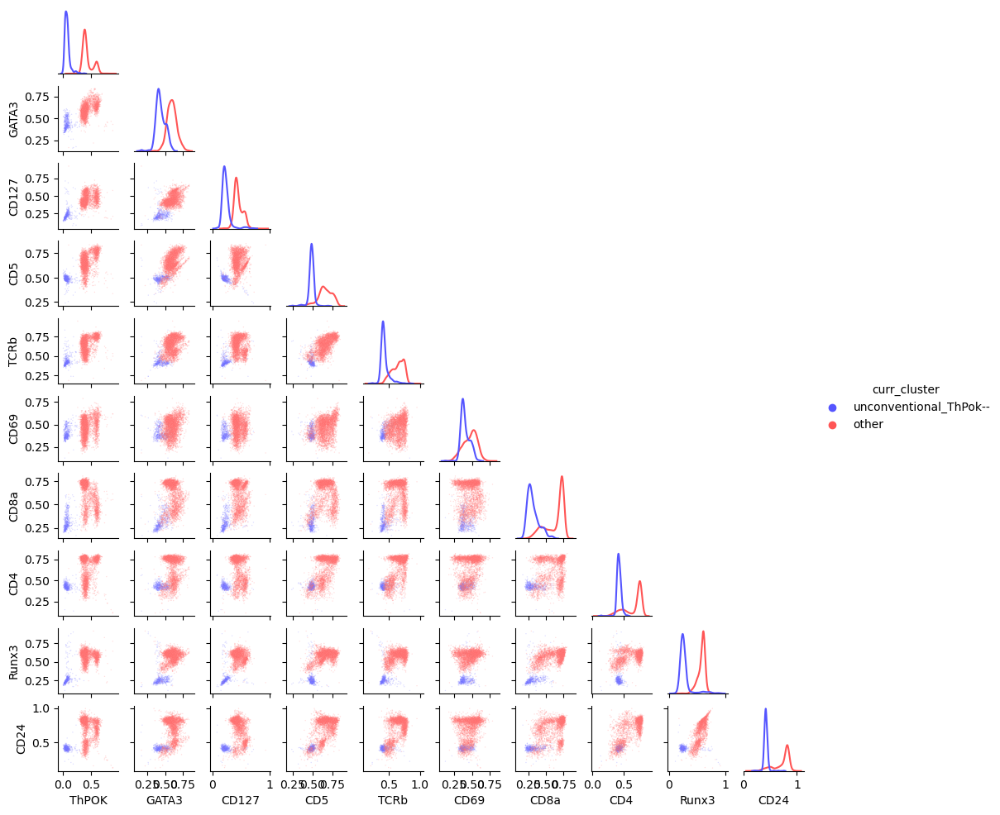

In [15]:
complete = pd.DataFrame(subset_data_direct.X, index=subset_data_direct.obs_names, columns=subset_data_direct.var_names)
complete['pheno'] = subset_data_direct.obs['pheno']
complete = complete.groupby('pheno', as_index=False).apply(lambda x: x.sample(min(x.shape[0], 5000))).reset_index()
complete = complete.drop('level_0', axis=1)
for i in np.unique(subset_data_direct.obs['pheno']):
    print(i)
    complete['curr_cluster'] = [str(i) if j == i else 'other' for j in complete['pheno']]
    df = complete.groupby('curr_cluster', as_index=False).apply(lambda x: x.sample(min(x.shape[0], 4000))).reset_index(level=0)
    df = df.drop('level_0', axis=1)
    df = df.sort_values(by=['curr_cluster'], ascending=False)
    display(df)
    g = sns.pairplot(df, hue="curr_cluster", corner=True, plot_kws={"s": 1, "alpha": 0.2}, diag_kind='kde',
                     hue_order=[str(i), 'other'],
                     size=1,
                     aspect=1,
                     diag_kws=dict(
                        common_norm=False,
                        fill=False),
                     palette=sns.color_palette("seismic", as_cmap=False, n_colors=2)
                    )
    plt.savefig('pairplots/PARC_new_' + str(i) + '.pdf')
    plt.show()

Remove unconventional cells for export to figures

In [8]:
wo_uncoventional = subset_data[[i for i in subset_data.obs_names if 'unconventional' not in subset_data.obs.loc[i, 'pheno']]].copy()

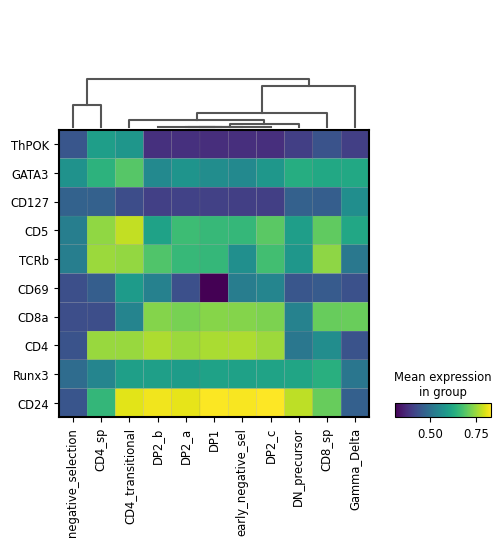

In [9]:
sc.tl.dendrogram(wo_uncoventional, var_names=subset_data.var_names, groupby='pheno', optimal_ordering=True)
sc.pl.matrixplot(wo_uncoventional, var_names=subset_data.var_names, swap_axes=True,
                 dendrogram=True, groupby='pheno', use_raw=False, save='matrixplot_wo_unconventional.pdf')

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


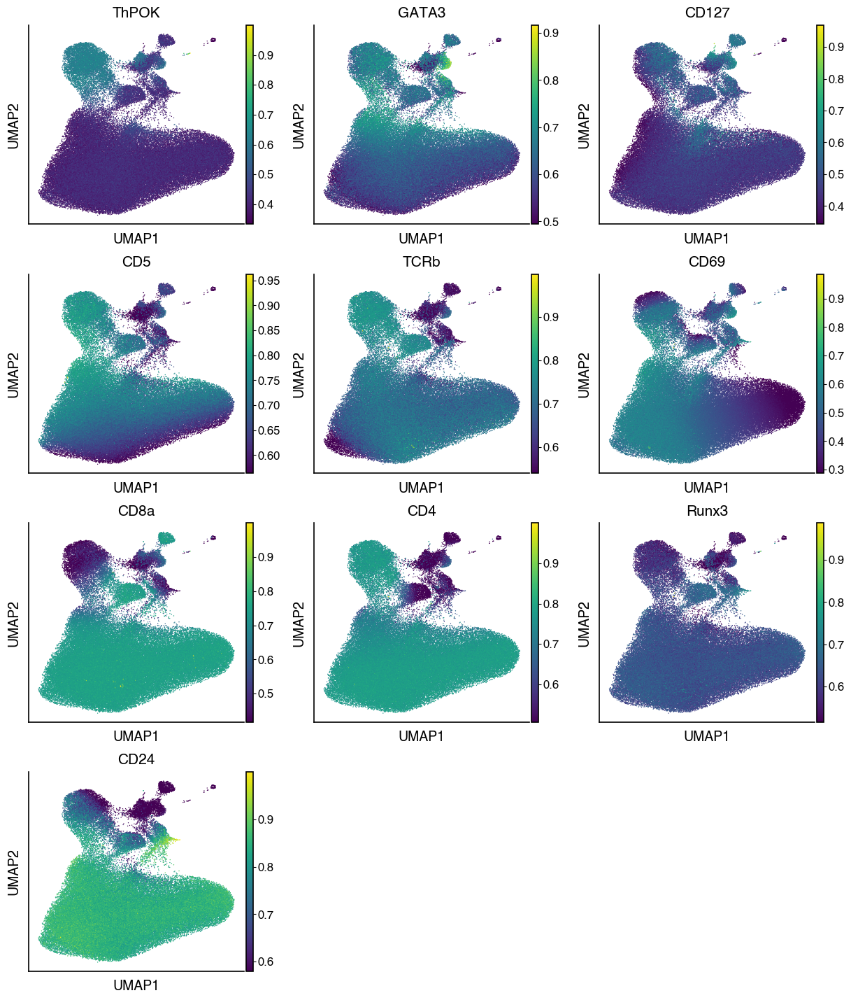

In [20]:
sc.pl.umap(subset_data[np.random.choice(subset_data.obs_names, size=100000, replace=False)], color=subset_data.var_names, size=4, save="_all_stainings.pdf", ncols=3, use_raw=False, vmin='p5')   

# Export clusters to FlowJo

How to export clusters for display in FlowJo. CSV file has to have same number of events as FCS files.

In [3]:
clustered_all = sc.read(folder + "subset_data_flow_thymus.h5ad")

In [4]:
folder_files = [x for x in folder_files if x[-3:] == 'fcs']
all_data = {}
compensation = {}
sample_dict = {
    file[-7:-4]:file.split('.')[0] for file in folder_files if "Compensation" not in file}

In [5]:
all_data = {}

for i in folder_files:
    if 'Compensation Controls' in i:
        continue
    else:
        fd = flowio.FlowData(folder + i)
        spill_over = flowutils.compensate.get_spill(fd.text['spill'])
        events = np.reshape(fd.events, (-1, fd.channel_count))
        xform_events = flowutils.transforms.logicle(events, channel_indices=None)

        channels = pd.DataFrame(fd.channels).T
        channels.PnS.fillna(channels.PnN, inplace=True)
        channels.rename(columns={"PnN": "Channel", "PnS": "Staining"}, inplace=True)
        channels.index = channels['Staining']
        
        name = i.split('.')[0]
        
        all_data[name] = sc.AnnData(events)
        all_data[name].layers['biexponential'] = xform_events
        all_data[name].layers['unnormalized'] = events
        all_data[name].var = channels
        all_data[name].obs['Sample'] = name
        all_data[name].obs['Timepoint'] = name.split("_")[0]
        all_data[name].obs['Drug'] = name.split("_")[1]
        all_data[name].obs['Dose'] = name.split("_")[2].split('-')[0] if name.split("_")[2].split('-')[0]!="drug" else "0ug" 
        all_data[name].obs['Tube'] = name.split("_")[3]

In [6]:
clustered_all.obs['Original_Index'] = [i[0] for i in clustered_all.obs.index.str.split("-")]

In [7]:
dict( enumerate(clustered_all.obs['pheno'].cat.categories ) )

{0: 'DP1',
 1: 'DP2_a',
 2: 'CD8_sp',
 3: 'DP2_c',
 4: 'CD4_transitional',
 5: 'Gamma_Delta',
 6: 'DN_precursor',
 7: 'negative_selection',
 8: 'unconventional_ThPok--',
 9: 'unconventional_ThPok++',
 10: 'DP2_b',
 11: 'early_negative_sel',
 12: 'CD4_sp'}

In [8]:
for i in all_data:
    tube_index = i[-3:]
    print(i, tube_index, all_data[i].n_obs)
    all_data[i].obsm['X_umap'] = pd.DataFrame(np.zeros([all_data[i].n_obs, 2]), index=all_data[i].obs_names)
    indices = np.where(clustered_all.obs['Tube']==tube_index)[0]
    subset = clustered_all[indices]
    subset.index = subset.obs['Original_Index']
    all_data[i].obsm['X_umap'].loc[subset.index] = subset.obsm['X_umap']
    all_data[i].obsm['X_umap'].to_csv(folder + i[:-4] + "_umap_coords.csv", index=False, header=False)

48h_CsA_200ng-1_016 016 687332
48h_CsA_200ng-2_017 017 816075
48h_CsA_200ng-3_018 018 1000000
48h_No_drug-1_013 013 928723
48h_No_drug-2_014 014 743458
48h_No_drug-3_015 015 663587
48h_U0126_10ug-1_022 022 900963
48h_U0126_10ug-2_023 023 616137
48h_U0126_10ug-3_024 024 728116
48h_U0126_2ug-1_019 019 595660
48h_U0126_2ug-2_020 020 653424
48h_U0126_2ug-3_021 021 813019
72h_CsA_200ng-1_004 004 720060
72h_CsA_200ng-2_005 005 623668
72h_CsA_200ng-3_006 006 679910
72h_No_drug-1_001 001 468443
72h_No_drug-2_002 002 437131
72h_No_drug-3_003 003 584277
72h_U0126_10ug-1_010 010 526755
72h_U0126_10ug-2_011 011 710349
72h_U0126_10ug-3_012 012 618765
72h_U0126_2ug-1_007 007 470265
72h_U0126_2ug-2_008 008 542821
72h_U0126_2ug-3_009 009 367404


In [ ]:
for i in all_data:
    tube_index = i[-3:]
    print(i, tube_index)
    cluster = all_data[i].obs
    subset = clustered_all[clustered_all.obs['Tube']==tube_index].obs.copy()
    subset['pheno'] = subset['pheno'].cat.codes.astype(int)
    subset.index = subset['Original_Index']
    cluster = cluster.merge(subset['pheno'], left_index=True, right_index=True, how='left')
    cluster['pheno'] = cluster['pheno'].fillna(100)
    cluster['pheno'].astype(int).to_csv(folder + i[:-4] + "_grouped.csv", index=False, header=False)

48h_CsA_200ng-1_016 016
48h_CsA_200ng-2_017 017
48h_CsA_200ng-3_018 018
48h_No_drug-1_013 013
48h_No_drug-2_014 014
48h_No_drug-3_015 015
48h_U0126_10ug-1_022 022
48h_U0126_10ug-2_023 023
48h_U0126_10ug-3_024 024
48h_U0126_2ug-1_019 019
48h_U0126_2ug-2_020 020
48h_U0126_2ug-3_021 021
72h_CsA_200ng-1_004 004
72h_CsA_200ng-2_005 005
72h_CsA_200ng-3_006 006
72h_No_drug-1_001 001
72h_No_drug-2_002 002
72h_No_drug-3_003 003
72h_U0126_10ug-1_010 010
72h_U0126_10ug-2_011 011
72h_U0126_10ug-3_012 012
72h_U0126_2ug-1_007 007
72h_U0126_2ug-2_008 008
72h_U0126_2ug-3_009 009
